In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from pathlib import Path
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.mixture import GaussianMixture 
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity
from tabulate import tabulate
import os
import glob
import librosa
import librosa.display
import torch
import torchaudio
from torch.utils.data import DataLoader, random_split
import torchaudio.transforms as transforms
from dataset import SpectrogramDataset
from sklearn.metrics import confusion_matrix
from models import CustomCNNModel,FinetuningClassifier,ContrastiveCNN
from utils import AudioDataProcessor,sample_balanced_representations,compute_cosine_similarity,plot_similarity_heatmap
from config import DATA_PATH, BATCH_SIZE, MODELS_PATH, RESULTS_PATH,MODELSTRS,FIG_PATH,SAMPLING_RATE,FONTSIZE,LATENT_DIM,EXPORT_DATA_PATH,CHIMPANZEE_DATA_PATH

In [8]:
target_class =  'chimpanzee_ir'
modelstrs = ['dense121']
filelist = []
baseline_upper_bound = 51
for i in range(0,baseline_upper_bound):
    for modelstr in modelstrs:
        filelist.append(f'{modelstr}_test_results_{target_class}_experiment_{i}.csv')
df = pd.concat([pd.read_csv(f'{RESULTS_PATH}/{file}') for file in filelist]).reset_index(drop=True)
# compute the mean and std of the test_acc column
df_mean  = df['test_acc'].mean()
df_std = df['test_acc'].std()
# round to 3 decimal places and print on the same line
print(f'{round(df_mean,3)} ± {round(df_std,3)}')

# get the index of the maximum value in the test_acc column
dense121_idx = df['test_acc'].idxmax()
print(df.iloc[dense121_idx])

0.539 ± 0.015
test_loss    1.351913
test_acc     0.573118
test_f1      0.540213
Name: 45, dtype: float64


In [9]:
modelstrs = ['resnet18']
filelist = []
for i in range(0,baseline_upper_bound):
    for modelstr in modelstrs:
        filelist.append(f'{modelstr}_test_results_{target_class}_experiment_{i}.csv')
df = pd.concat([pd.read_csv(f'{RESULTS_PATH}/{file}') for file in filelist]).reset_index(drop=True)
# compute the mean and std of the test_acc column
df_mean  = df['test_acc'].mean()
df_std = df['test_acc'].std()
# round to 3 decimal places and print on the same line
print(f'{round(df_mean,3)} ± {round(df_std,3)}')

# get the index of the maximum value in the test_acc column
resnet18_idx = df['test_acc'].idxmax()
print(df.iloc[resnet18_idx])

0.638 ± 0.016
test_loss    1.224878
test_acc     0.673118
test_f1      0.664212
Name: 44, dtype: float64


In [4]:
print(resnet18_idx, dense121_idx)

44 45


In [10]:
modelstrs = ['dense121', 'resnet18']
results = []


for modelstr in modelstrs:
    filelist = []
    for i in range(baseline_upper_bound):  # Removed the explicit range(0,30) as it is redundant
        file_name = f'{modelstr}_test_results_{target_class}_experiment_{i}.csv'
        filelist.append(f'{RESULTS_PATH}/{file_name}')
        
    # Concatenate CSVs into a single DataFrame
    df = pd.concat((pd.read_csv(file) for file in filelist)).reset_index(drop=True)
    
    # Compute mean and standard deviation
    df_mean = round(df['test_acc'].mean(), 3)
    df_std = round(df['test_acc'].std(), 3)
    
    # Find the index and row for the maximum test accuracy
    max_idx = df['test_acc'].idxmax()
    max_acc_row = df.iloc[max_idx]

    # Append results to the list
    results.append([modelstr, f"{df_mean} ± {df_std}", max_acc_row['test_acc']])

# Prepare the table
headers = ["Model", "Mean Accuracy ± Std", "Best Accuracy"]
latex_table = tabulate(results, headers=headers, tablefmt="latex")

print(latex_table)

\begin{tabular}{llr}
\hline
 Model    & Mean Accuracy ± Std   &   Best Accuracy \\
\hline
 dense121 & 0.539 ± 0.015         &        0.573118 \\
 resnet18 & 0.638 ± 0.016         &        0.673118 \\
\hline
\end{tabular}


In [11]:
import pandas as pd
from tabulate import tabulate

modelstrs = ['dense121', 'resnet18']
results = []

for modelstr in modelstrs:
    filelist = []
    for i in range(baseline_upper_bound):  # Assumes baseline_upper_bound is defined elsewhere
        file_name = f'{modelstr}_test_results_{target_class}_experiment_{i}.csv'
        filelist.append(f'{RESULTS_PATH}/{file_name}')
        
    # Concatenate all CSVs into one DataFrame
    df = pd.concat((pd.read_csv(file) for file in filelist)).reset_index(drop=True)
    
    # Accuracy metrics
    acc_mean = round(df['test_acc'].mean(), 3)
    acc_std = round(df['test_acc'].std(), 3)
    acc_best = round(df['test_acc'].max(), 3)

    # F1-score metrics
    f1_mean = round(df['test_f1'].mean(), 3)
    f1_std = round(df['test_f1'].std(), 3)
    f1_best = round(df['test_f1'].max(), 3)

    # Append combined results
    results.append([
        modelstr,
        f"{acc_mean} ± {acc_std}",
        acc_best,
        f"{f1_mean} ± {f1_std}",
        f1_best
    ])

# Create LaTeX table
headers = ["Model", "Mean Accuracy ± Std", "Best Accuracy", "Mean F1 ± Std", "Best F1"]
latex_table = tabulate(results, headers=headers, tablefmt="latex")

print(latex_table)


\begin{tabular}{llrlr}
\hline
 Model    & Mean Accuracy ± Std   &   Best Accuracy & Mean F1 ± Std   &   Best F1 \\
\hline
 dense121 & 0.539 ± 0.015         &           0.573 & 0.506 ± 0.014   &     0.54  \\
 resnet18 & 0.638 ± 0.016         &           0.673 & 0.63 ± 0.017    &     0.664 \\
\hline
\end{tabular}


In [12]:
#python finetuning.py --experiment 0 --modelstr resnet18 --target_class chimpanzee_ir --contrastive_method supcon

In [13]:
modelstrs = ['resnet18', 'dense121']
methods = ['supcon', 'triplet']

results = []
ft_upper_bound = 51
for modelstr in modelstrs:
    for method in methods:
        filelist = []
        for i in range(ft_upper_bound):  # Simplified range(0,5) to range(5)
            file_name = f'{modelstr}_ft_full_test_results_chimpanzee_ir_{method}_experiment_{i}.csv'
            filelist.append(f'{RESULTS_PATH}/{file_name}')
        
        # Concatenate CSVs into a single DataFrame
        df = pd.concat((pd.read_csv(file) for file in filelist)).reset_index(drop=True)
        
        # Compute mean and standard deviation
        df_mean = round(df['test_acc'].mean(), 3)
        df_std = round(df['test_acc'].std(), 3)
        
        # Find the index and row for the maximum test accuracy
        max_idx = df['test_acc'].idxmax()
        max_acc_row = df.iloc[max_idx]

        # print(f"{modelstr} {method} {max_idx} {max_acc_row['test_acc'] }")

        # Append results to the list
        results.append([modelstr, method, f"{df_mean} ± {df_std}", max_acc_row['test_acc']])

# Prepare the table
headers = ["Model", "Method", "Mean Accuracy ± Std", "Best Accuracy"]
latex_table = tabulate(results, headers=headers, tablefmt="latex")

print(latex_table)

\begin{tabular}{lllr}
\hline
 Model    & Method   & Mean Accuracy ± Std   &   Best Accuracy \\
\hline
 resnet18 & supcon   & 0.649 ± 0.009         &        0.662366 \\
 resnet18 & triplet  & 0.599 ± 0.008         &        0.615054 \\
 dense121 & supcon   & 0.615 ± 0.007         &        0.630108 \\
 dense121 & triplet  & 0.618 ± 0.004         &        0.625806 \\
\hline
\end{tabular}


In [8]:
modelstrs = ['resnet18', 'dense121']
methods = ['supcon', 'triplet']

results = []
ft_upper_bound = 51
for modelstr in modelstrs:
    for method in methods:
        filelist = []
        for i in range(ft_upper_bound):  # Simplified range(0,5) to range(5)
            file_name = f'{modelstr}_ft_full_test_results_chimpanzee_ir_{method}_experiment_{i}.csv'
            filelist.append(f'{RESULTS_PATH}/{file_name}')
        
        # Concatenate CSVs into a single DataFrame
        df = pd.concat((pd.read_csv(file) for file in filelist)).reset_index(drop=True)
        
        # Compute mean and standard deviation
        df_mean = round(df['test_acc'].mean(), 3)
        df_std = round(df['test_acc'].std(), 3)
        
        # Find the index and row for the maximum test accuracy
        max_idx = df['test_acc'].idxmax()
        max_acc_row = df.iloc[max_idx]

        # print(f"{modelstr} {method} {max_idx} {max_acc_row['test_acc'] }")

        # Append results to the list
        results.append([modelstr, method, f"{df_mean} ± {df_std}", max_acc_row['test_acc']])

# Prepare the table
headers = ["Model", "Method", "Mean Accuracy ± Std", "Best Accuracy"]
latex_table = tabulate(results, headers=headers, tablefmt="latex")

print(latex_table)

\begin{tabular}{lllr}
\hline
 Model    & Method   & Mean Accuracy ± Std   &   Best Accuracy \\
\hline
 resnet18 & supcon   & 0.649 ± 0.009         &        0.662366 \\
 resnet18 & triplet  & 0.599 ± 0.008         &        0.615054 \\
 dense121 & supcon   & 0.615 ± 0.007         &        0.630108 \\
 dense121 & triplet  & 0.618 ± 0.004         &        0.625806 \\
\hline
\end{tabular}


In [9]:
sns.set_theme()

In [15]:
modelstrs = ['resnet18', 'dense121']
methods = ['supcon', 'triplet']
ft_upper_bound = 51

results = []

for modelstr in modelstrs:
    for method in methods:
        filelist = []
        for i in range(ft_upper_bound):
            file_name = f'{modelstr}_ft_full_test_results_chimpanzee_ir_{method}_experiment_{i}.csv'
            filelist.append(f'{RESULTS_PATH}/{file_name}')
        
        # Concatenate all experiment result files
        df = pd.concat((pd.read_csv(file) for file in filelist)).reset_index(drop=True)
        
        # Accuracy metrics
        acc_mean = round(df['test_acc'].mean(), 3)
        acc_std = round(df['test_acc'].std(), 3)
        acc_best = df['test_acc'].max()

        # F1-score metrics
        f1_mean = round(df['test_f1'].mean(), 3)
        f1_std = round(df['test_f1'].std(), 3)
        f1_best = df['test_f1'].max()

        results.append([
            modelstr,
            method,
            f"{acc_mean} ± {acc_std}",
            round(acc_best, 3),
            f"{f1_mean} ± {f1_std}",
            round(f1_best, 3)
        ])

# Prepare the LaTeX table
headers = ["Model", "Method", "Mean Accuracy ± Std", "Best Accuracy", "Mean F1 ± Std", "Best F1"]
latex_table = tabulate(results, headers=headers, tablefmt="latex")

print(latex_table)


\begin{tabular}{lllrlr}
\hline
 Model    & Method   & Mean Accuracy ± Std   &   Best Accuracy & Mean F1 ± Std   &   Best F1 \\
\hline
 resnet18 & supcon   & 0.649 ± 0.009         &           0.662 & 0.645 ± 0.01    &     0.658 \\
 resnet18 & triplet  & 0.599 ± 0.008         &           0.615 & 0.57 ± 0.013    &     0.598 \\
 dense121 & supcon   & 0.615 ± 0.007         &           0.63  & 0.581 ± 0.009   &     0.61  \\
 dense121 & triplet  & 0.618 ± 0.004         &           0.626 & 0.58 ± 0.004    &     0.589 \\
\hline
\end{tabular}


In [14]:
processor = AudioDataProcessor(DATA_PATH)

samples = AudioDataProcessor.get_samples(processor, num_samples=6)

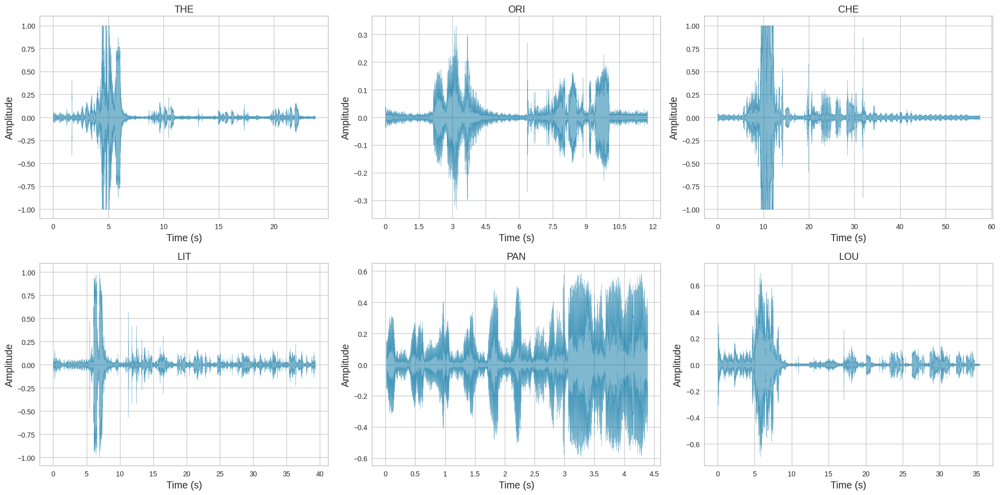

In [15]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
# fig.suptitle('6 Random Samples of Panthoot Vocalizations', fontsize=FONTSIZE)
for i in range(6):
    idx = i % 3
    idy = i // 3
    librosa.display.waveshow(samples[i]['waveform'][0].squeeze().numpy(), sr=samples[i]['waveform'][1], ax=ax[idy, idx], axis='s', alpha=0.5)
    ax[idy, idx].set_title(samples[i]['class'].upper(), fontsize=FONTSIZE)
    ax[idy, idx].set_ylabel('Amplitude', fontsize=FONTSIZE)
    ax[idy, idx].set_xlabel('Time (s)', fontsize=FONTSIZE)
    # add grid
    ax[idy, idx].grid(True)
plt.tight_layout()
plt.savefig(FIG_PATH + '/random_waveform_samples.png', dpi=300, bbox_inches='tight')
plt.show()

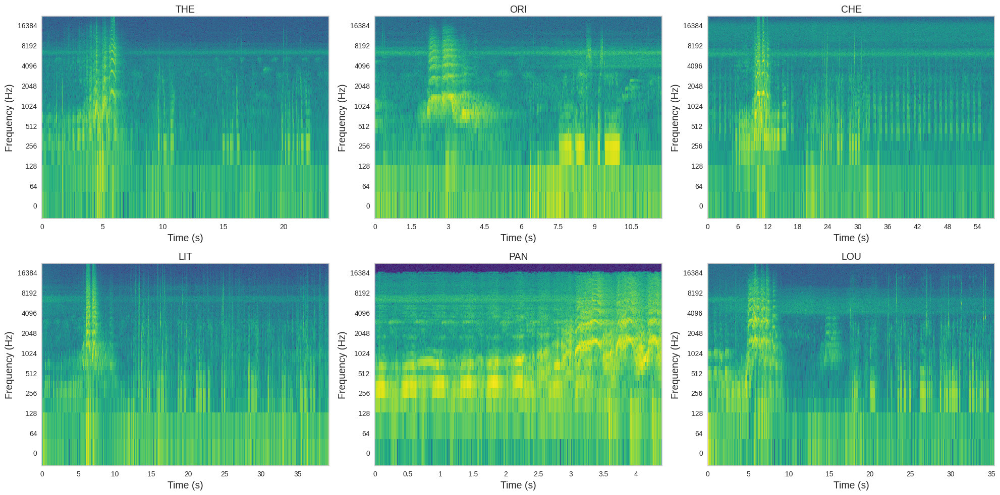

In [16]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
# fig.suptitle('6 Random Samples from ESC-50 dataset')
for i in range(6):
    idx = i % 3
    idy = i // 3
    librosa.display.specshow(samples[i]['log_spectrogram'][0].squeeze().numpy(), sr=samples[i]['waveform'][1], hop_length=256, ax=ax[idy, idx], x_axis='s', y_axis='log',cmap='viridis')
    ax[idy, idx].set_title(samples[i]['class'].upper(), fontsize=FONTSIZE)
    ax[idy, idx].set_ylabel('Frequency (Hz)', fontsize=FONTSIZE)
    ax[idy, idx].set_xlabel('Time (s)', fontsize=FONTSIZE)
plt.tight_layout()
plt.savefig(FIG_PATH + '/random_log_spectrogram_samples.png', dpi=300, bbox_inches='tight')
plt.show()

In [17]:
dataset = SpectrogramDataset(f"{CHIMPANZEE_DATA_PATH}/val", duration=3, target_sample_rate=SAMPLING_RATE)

dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
sample,label = next(iter(dataloader))

## Analysis for DenseNet121 Classifier

In [18]:
# Load the trained model and make predictions
modelstr =  MODELSTRS[-1]
experiment = dense121_idx
target_class = "chimpanzee_ir"
model_type = "classifier"

In [31]:

model = CustomCNNModel(num_classes=len(dataset.classes), weights=None, modelstr=MODELSTRS[-1])

model.load_state_dict(torch.load(f'{MODELS_PATH}/custom_{modelstr}_{target_class}_experiment_{experiment}.pth', map_location=torch.device('cpu')))
model.eval();

In [20]:
with torch.inference_mode():
    data = sample['data']
    output = model(data)
    _, predicted = torch.max(output, 1)
    # get the probability of each class
    probabilities = torch.nn.functional.softmax(output, dim=1)
    # get the probability of the predicted class
    predicted_prob = torch.max(probabilities, 1)[0]
    print('Predicted: ', [dataset.classes[p.item()] for p in predicted])

Predicted:  ['PAN', 'ARN', 'LIT', 'FRE', 'THE', 'CHE', 'LIT', 'LIT', 'ARN', 'PAN', 'ARN', 'PAN', 'PAN', 'CHI', 'PAN', 'CHE', 'LIT', 'LIT', 'PAN', 'FRE', 'LIT', 'LIT', 'PAN', 'LOU', 'ARN', 'LIT', 'LIT', 'LIT', 'CHE', 'LIT', 'CHE', 'CHI', 'LIT', 'CHE', 'PAN', 'PAN', 'CHE', 'THE', 'LIT', 'PAN', 'THE', 'LIT', 'PAN', 'LIT', 'CHE', 'CHE', 'LOU', 'CHE', 'PAN', 'LIT', 'FRE', 'LOU', 'LIT', 'LIT', 'PAN', 'THE', 'LIT', 'THE', 'PAN', 'LOU', 'ARN', 'PAN', 'ARN', 'ARN']


In [21]:
# Plot six random samples with their predictions 
idxs = np.random.randint(0, len(sample['data']), 6)

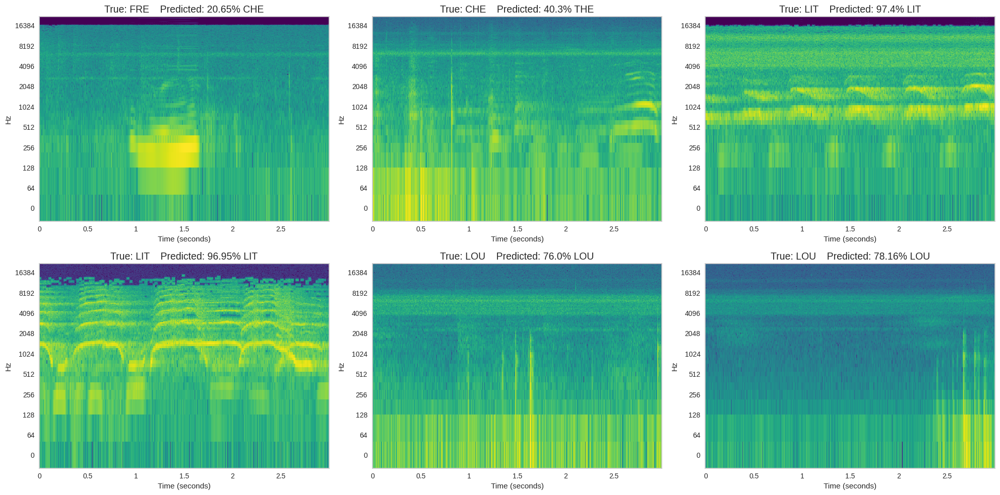

In [22]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
# fig.suptitle('6 Random Samples from ESC-50 dataset')
for i in range(6):
    idx = i % 3
    idy = i // 3
    librosa.display.specshow(sample['data'][idxs[i]].squeeze().numpy(), sr=44100, hop_length=256, ax=ax[idy, idx], x_axis='s', y_axis='log',cmap='viridis')
    ax[idy, idx].set_title(f'True: {dataset.classes[label[idxs[i]]].upper()}    Predicted: {np.round(predicted_prob[idxs[i]].item() *100, 2)}% {dataset.classes[predicted[idxs[i]].item()].upper()}', fontsize=FONTSIZE)
plt.tight_layout()
plt.savefig(FIG_PATH + f'/random_log_spectrogram_{target_class}_{modelstr}_{model_type}_experiment_{experiment}_samples_predictions.png', dpi=300)
plt.show()

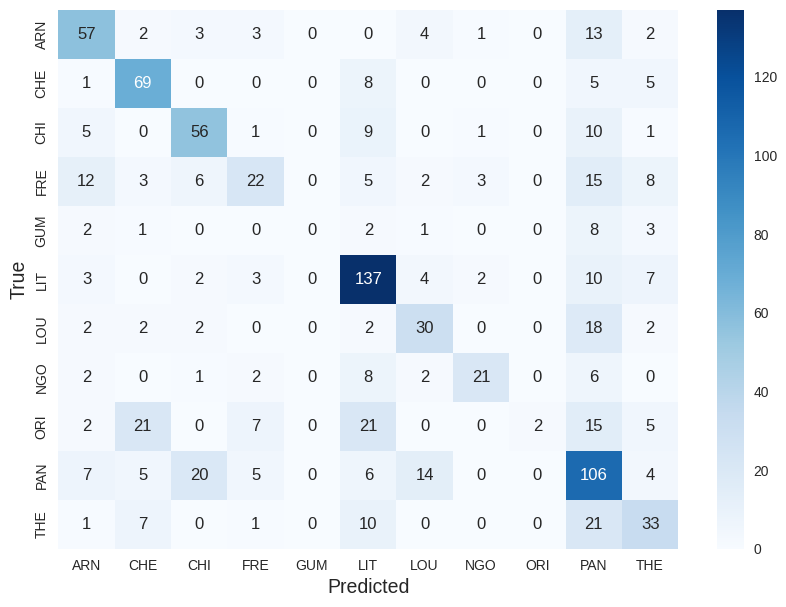

In [23]:
# Plot confusion matrix 
df =  pd.read_csv(f"{RESULTS_PATH}/{modelstr}_test_scores_{target_class}_experiment_{dense121_idx}.csv")

true_labels = df['labels']
pred_labels = df['preds']
class_names = dataset.classes

cm = confusion_matrix(true_labels, pred_labels)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted', fontsize=FONTSIZE)
plt.ylabel('True', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_experiment_{dense121_idx}_confusion_matrix.png', dpi=300)
plt.show()


### Out of distribution generalization analysis for Classifier

### Analysis of learned representations

In [24]:
dense121_idx, resnet18_idx

(45, 44)

In [25]:
experiment = dense121_idx

data = np.load(f'{EXPORT_DATA_PATH}/features_{model_type}_{modelstr}_{target_class}_experiment_{experiment}.npz', allow_pickle=True)

features = data['features']
labels = data['labels']
label_names = data['label_classes']

In [26]:
class_counts = {class_name: label_names.tolist().count(class_name) for class_name in dataset.classes} 

class_counts_list = [label_names.tolist().count(class_name) for class_name in dataset.classes]


class_counts_weights = np.array(class_counts_list)/np.sum(class_counts_list)  

class_counts_weights

array([0.08961724, 0.07655283, 0.08961724, 0.09053404, 0.02406601,
       0.11666285, 0.09122164, 0.06761403, 0.03965162, 0.22209489,
       0.09236764])

In [27]:
np.bincount(labels)

array([391, 334, 391, 395, 105, 509, 398, 295, 173, 969, 403])

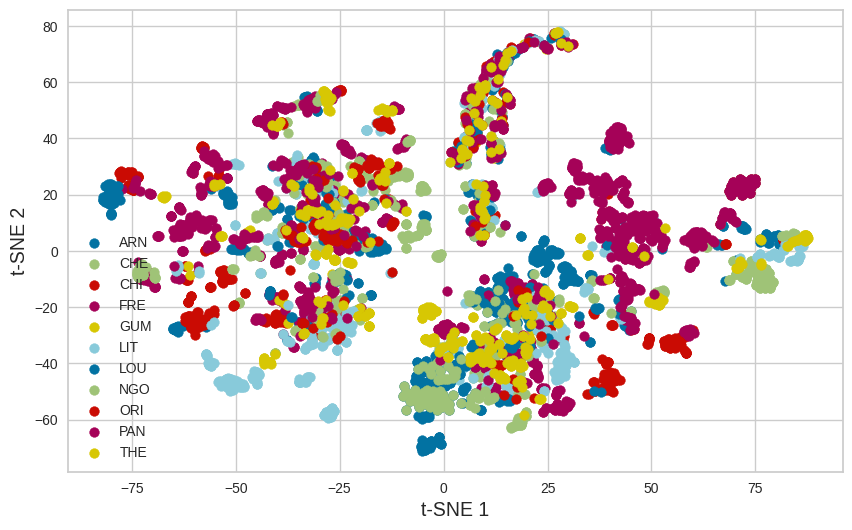

In [28]:
# use t-SNE to reduce the dimensionality of the embeddings

tsne = TSNE(n_components=2, random_state=0)
features_embedded = tsne.fit_transform(features)

plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.xlabel('t-SNE 1', fontsize=FONTSIZE)
plt.ylabel('t-SNE 2', fontsize=FONTSIZE)
# plt.title(f't-SNE of embeddings of learned Panthoot representations', fontsize=FONTSIZE+2)
plt.legend()
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_experiment_{experiment}_tsne.png', dpi=300, bbox_inches='tight')
plt.show()

/net/store/cv/users/ybrima/miniconda3/envs/deepc/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


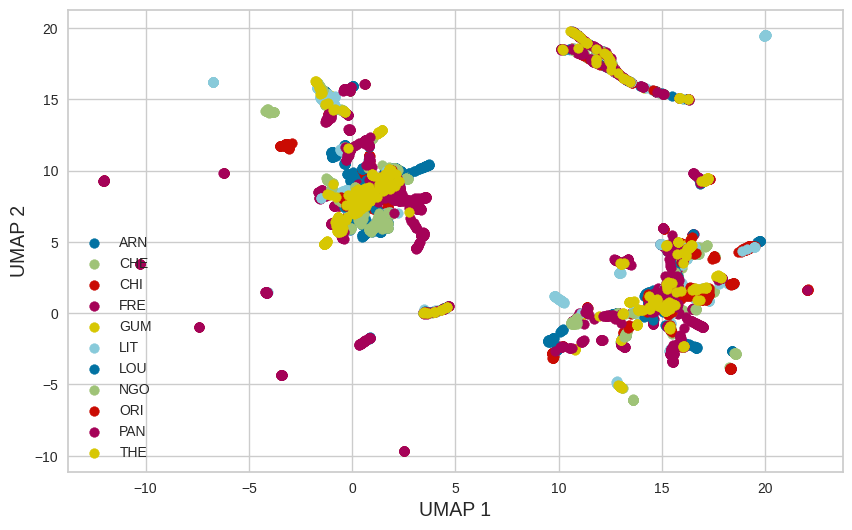

In [29]:
# use UMAP to reduce the dimensionality of the embeddings
reducer = umap.UMAP()
features_embedded = reducer.fit_transform(features)

# plot the embeddings
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.legend()
plt.xlabel('UMAP 1', fontsize=FONTSIZE)
plt.ylabel('UMAP 2', fontsize=FONTSIZE)
# plt.title(f'UMAP of embeddings of learned Panthoot representations', fontsize=FONTSIZE+2)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_experiment_{experiment}_umap.png', dpi=300, bbox_inches='tight')
plt.show()

/net/store/cv/users/ybrima/miniconda3/envs/deepc/lib/python3.12/site-packages/yellowbrick/utils/kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
/net/store/cv/users/ybrima/miniconda3/envs/deepc/lib/python3.12/site-packages/yellowbrick/cluster/elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


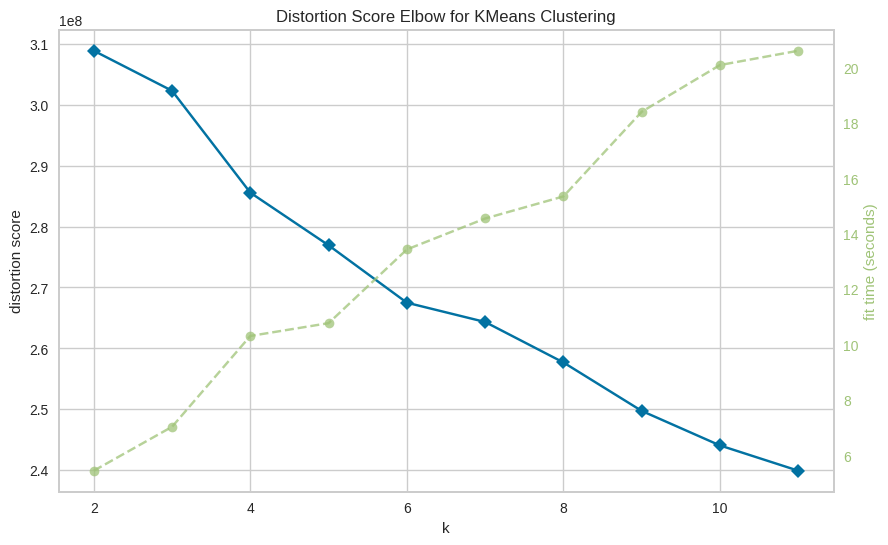

In [30]:
# use the elbow method to find the optimal number of clusters
fig, ax = plt.subplots(figsize=(10, 6))
kelbow_visualizer(KMeans(), features, k=(2,12))
# plt.title('Elbow Method for Optimal K', fontsize=FONTSIZE)
fig.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_experiment_{experiment}_elbow.png', dpi=300, bbox_inches='tight')
plt.show()

In [32]:
class_labels =  [ dataset.classes[label] for label in labels]

selected_representations, selected_labels = sample_balanced_representations(features, class_labels, dataset.classes, samples_per_class=50)


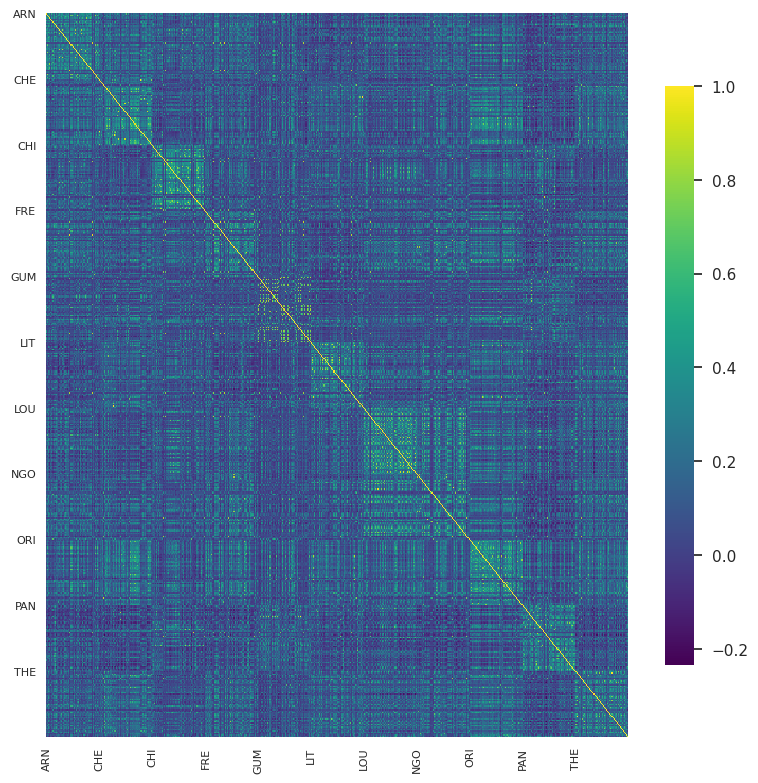

In [33]:
# calculate the cosine similarity of the embeddings
cosine_sim = cosine_similarity(selected_representations)

# plot the similarity heatmap
plot_similarity_heatmap(cosine_sim, selected_labels, f'{FIG_PATH}/cosine_similarity{model_type}_{modelstr}_{model_type}_heatmap.png')

In [35]:
dense121_idx

45

### Analyzing Result for fine-tuned model

In [38]:
# Load the trained model and make predictions
modelstr =  MODELSTRS[-1]
experiment = dense121_idx
target_class = "chimpanzee_ir"
model_type = "contrastive"
method = "triplet"


model = ContrastiveCNN(latent_dim=LATENT_DIM, weights=None, modelstr=modelstr)


classifier = FinetuningClassifier(model, num_classes=len(dataset.classes))
classifier.load_state_dict(torch.load(f'{MODELS_PATH}/custom_ft_full_{modelstr}_{target_class}_{method}_experiment_{experiment}.pth', map_location=torch.device('cpu')))

<All keys matched successfully>

In [39]:
with torch.inference_mode():
    data = sample['data']
    output = classifier(data)
    _, predicted = torch.max(output, 1)
    # get the probability of each class
    probabilities = torch.nn.functional.softmax(output, dim=1)
    # get the probability of the predicted class
    predicted_prob = torch.max(probabilities, 1)[0]
    print('Predicted: ', [dataset.classes[p.item()] for p in predicted])

Predicted:  ['FRE', 'PAN', 'LIT', 'LOU', 'THE', 'CHE', 'PAN', 'LIT', 'ARN', 'CHI', 'LOU', 'PAN', 'LOU', 'PAN', 'CHI', 'FRE', 'NGO', 'LIT', 'PAN', 'FRE', 'PAN', 'THE', 'PAN', 'LOU', 'THE', 'LIT', 'LIT', 'LIT', 'CHE', 'LIT', 'CHE', 'CHI', 'LIT', 'CHE', 'PAN', 'PAN', 'FRE', 'THE', 'FRE', 'LOU', 'ARN', 'PAN', 'PAN', 'LIT', 'CHE', 'CHE', 'LOU', 'PAN', 'LOU', 'LIT', 'LOU', 'THE', 'LIT', 'LIT', 'PAN', 'FRE', 'LIT', 'PAN', 'PAN', 'LOU', 'ARN', 'PAN', 'ARN', 'ARN']


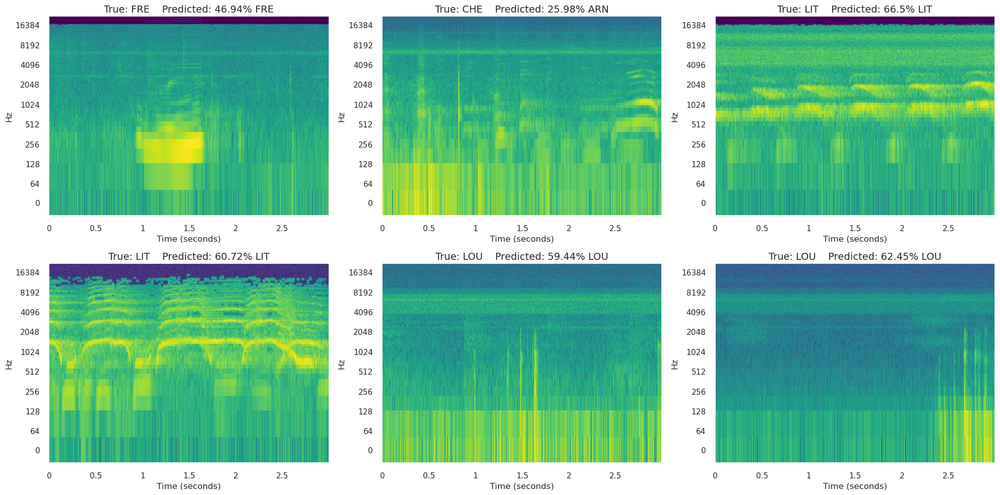

In [40]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
# fig.suptitle('6 Random Samples from ESC-50 dataset')
for i in range(6):
    idx = i % 3
    idy = i // 3
    librosa.display.specshow(sample['data'][idxs[i]].squeeze().numpy(), sr=44100, hop_length=256, ax=ax[idy, idx], x_axis='s', y_axis='log',cmap='viridis')
    ax[idy, idx].set_title(f'True: {dataset.classes[label[idxs[i]]].upper()}    Predicted: {np.round(predicted_prob[idxs[i]].item() *100, 2)}% {dataset.classes[predicted[idxs[i]].item()].upper()}', fontsize=FONTSIZE)
plt.tight_layout()
plt.savefig(FIG_PATH + f'/random_log_spectrogram_{target_class}_{modelstr}_{model_type}_experiment_{experiment}_{method}_samples_ft_predictions.png', dpi=300)
plt.show()

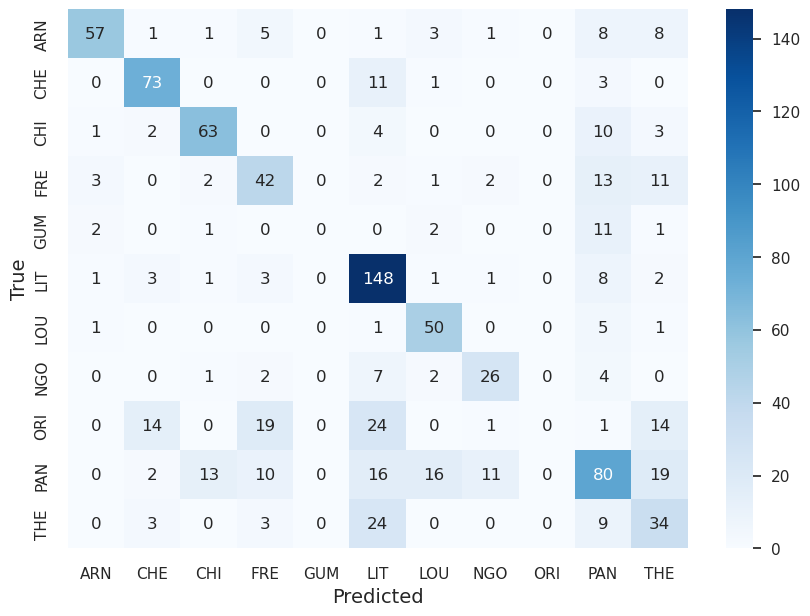

In [43]:
# Plot confusion matrix 
contrastive_method = 'supcon'
experiment = dense121_idx

df =  pd.read_csv(f'{RESULTS_PATH}/{modelstr}_ft_full_test_scores_{target_class}_{contrastive_method}_experiment_{experiment}.csv')

true_labels = df['labels']
pred_labels = df['preds']
class_names = dataset.classes

cm = confusion_matrix(true_labels, pred_labels)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted', fontsize=FONTSIZE)
plt.ylabel('True', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_{contrastive_method}_experiment_{experiment}_ft_confusion_matrix.png', dpi=300)
plt.show()


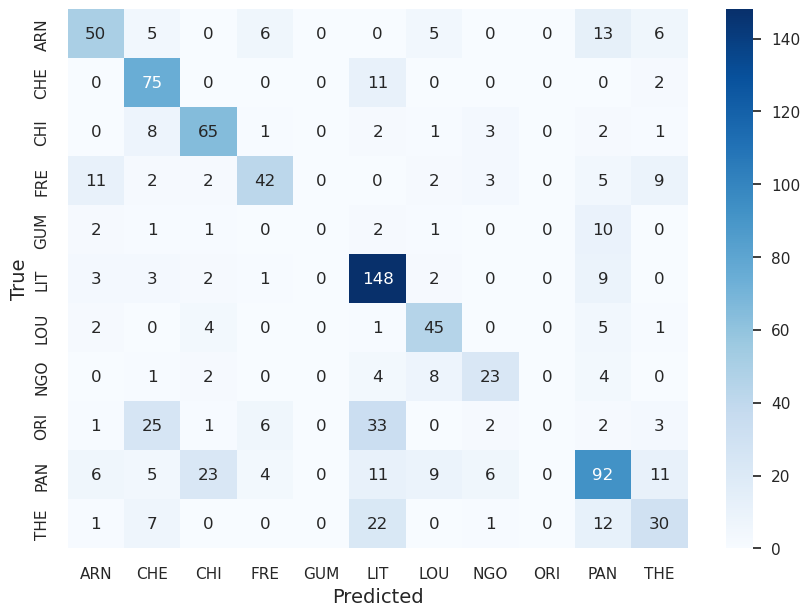

In [44]:
# Plot confusion matrix 
contrastive_method = 'triplet'
experiment = dense121_idx

df =  pd.read_csv(f'{RESULTS_PATH}/{modelstr}_ft_full_test_scores_{target_class}_{contrastive_method}_experiment_{experiment}.csv')

true_labels = df['labels']
pred_labels = df['preds']
class_names = dataset.classes

cm = confusion_matrix(true_labels, pred_labels)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted', fontsize=FONTSIZE)
plt.ylabel('True', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_{contrastive_method}_experiment_{experiment}_ft_confusion_matrix.png', dpi=300)
plt.show()


### Analysizing representations for contrastive model

In [46]:
model_type = 'contrastive'
experiment = 1
target_class = 'chimpanzee_ir'
method = 'supcon'
data = np.load(f'{EXPORT_DATA_PATH}/features_{model_type}_{modelstr}_{target_class}_{method}_experiment_{experiment}.npz', allow_pickle=True)

features = data['features']
labels = data['labels']
label_names = data['label_classes']

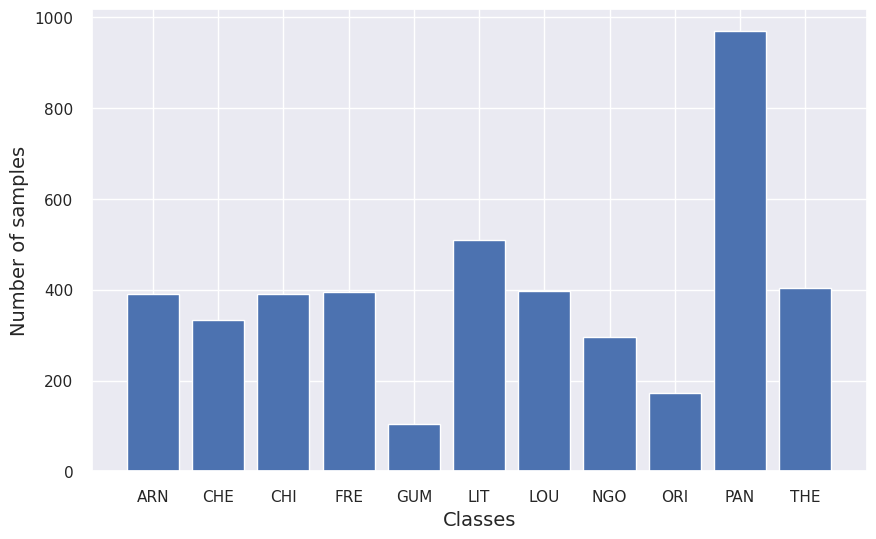

In [48]:
# make bar plot of the number of samples per class
plt.figure(figsize=(10, 6))
data  =  np.bincount(labels)

plt.bar(np.unique(label_names), np.bincount(labels))
plt.xlabel('Classes', fontsize=FONTSIZE)
plt.ylabel('Number of samples', fontsize=FONTSIZE)
# plt.title(f'Number of samples per class in {model_type} {modelstr} {target_class} {method} experiment {experiment}', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/data_distribution_samples_per_class.png', dpi=300, bbox_inches='tight')
plt.show()

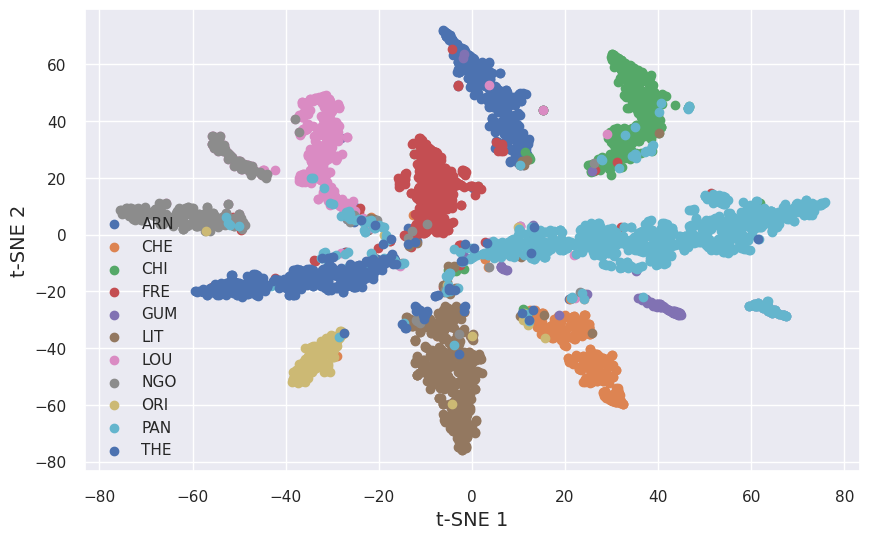

In [49]:
# use t-SNE to reduce the dimensionality of the embeddings

tsne = TSNE(n_components=2, random_state=0)
features_embedded = tsne.fit_transform(features)

plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.xlabel('t-SNE 1', fontsize=FONTSIZE)
plt.ylabel('t-SNE 2', fontsize=FONTSIZE)
# plt.title(f't-SNE of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.legend()
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_tsne.png', dpi=300, bbox_inches='tight')
plt.show()

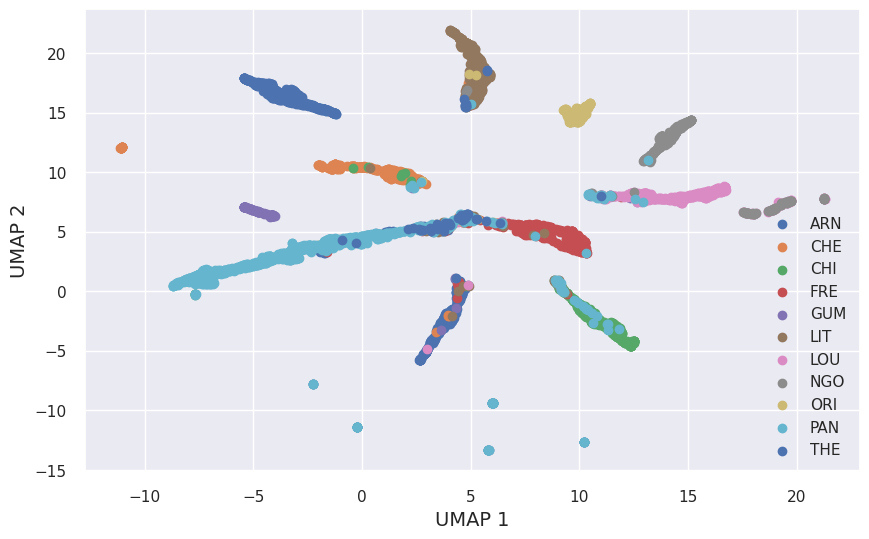

In [269]:
# use UMAP to reduce the dimensionality of the embeddings
reducer = umap.UMAP()
features_embedded = reducer.fit_transform(features)

# plot the embeddings
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.legend()
plt.xlabel('UMAP 1', fontsize=FONTSIZE)
plt.ylabel('UMAP 2', fontsize=FONTSIZE)
# plt.title(f'UMAP of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_umap.png', dpi=300, bbox_inches='tight')
plt.show()

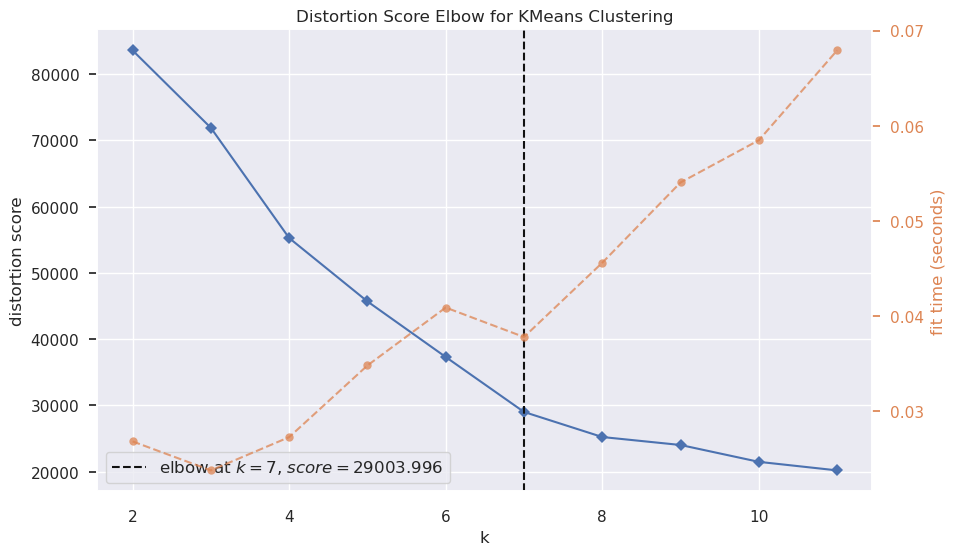

In [50]:
# use the elbow method to find the optimal number of clusters
fig, ax = plt.subplots(figsize=(10, 6))
kelbow_visualizer(KMeans(max_iter=1200, algorithm='elkan'), features, k=(2,12))
fig.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_elbow.png', dpi=300, bbox_inches='tight')
plt.show()

In [51]:
class_labels =  [ dataset.classes[label] for label in labels]


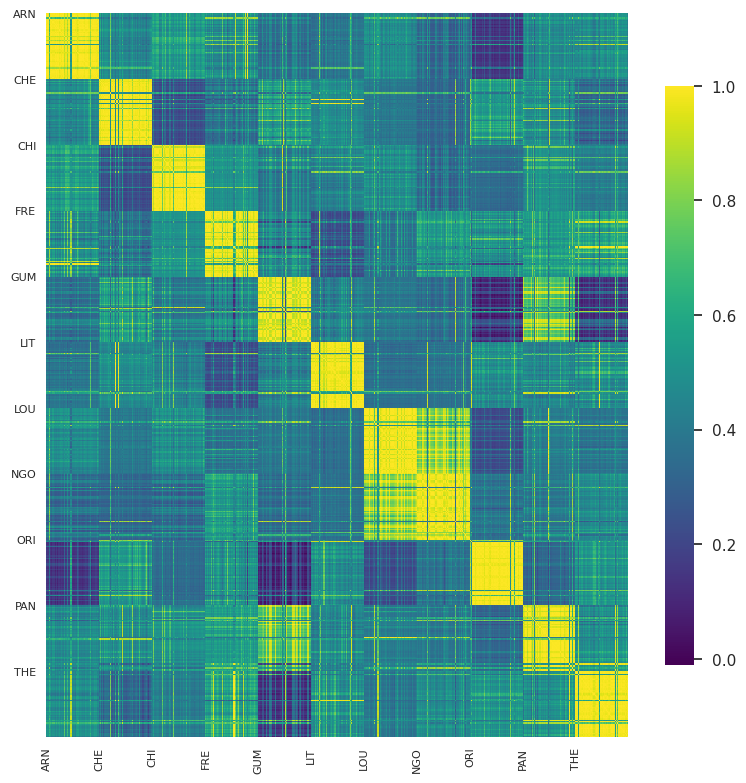

In [52]:
selected_representations, selected_labels  = sample_balanced_representations(features, class_labels, dataset.classes, samples_per_class=50)

# calculate the cosine similarity of the embeddings
cosine_sim = cosine_similarity(selected_representations)

# plot the similarity heatmap
plot_similarity_heatmap(cosine_sim, selected_labels, f'{FIG_PATH}/cosine_similarity_{model_type}_{modelstr}_{model_type}_{method}_heatmap.png')

In [53]:
import pandas as pd
from config import RESULTS_PATH

In [54]:
# Analysze the EERs of the contrastive models

df = pd.read_csv(f'{RESULTS_PATH}/eer_scores_contrastive_experiment_1.csv')

df 

,method,score,threshold
0,resnet18_supcon,0.098735,0.548687
1,resnet18_triplet,0.124323,0.451700
2,dense121_supcon,0.103880,0.618756
3,dense121_triplet,0.106472,0.456851


In [57]:
# Analysze the EERs of the contrastive models

df = pd.read_csv(f'{RESULTS_PATH}/eer_scores_contrastive_experiment_1__females.csv')

df 

,method,score,threshold
0,resnet18_supcon,0.535546,0.482909
1,resnet18_triplet,0.504966,0.334140
2,dense121_supcon,0.491797,0.672048
3,dense121_triplet,0.495994,0.333616


### Contrastive Representation Analysis for out-of-distribution samples

In [58]:
model_type = 'contrastive'
experiment = 1
modelstr = MODELSTRS[-1]
method = 'triplet'  
target_class = ''
data = np.load(f'{EXPORT_DATA_PATH}/features_{model_type}_{modelstr}_{target_class}_{method}_experiment_{experiment}_females.npz', allow_pickle=True)

features = data['features']
labels = data['labels']
label_names = data['label_classes']

In [59]:
FEMALE_DATA_PATH = "/net/projects/data/Chimpanzee/UOS-Yusuf/Full_Data/FEMALES"

In [60]:
dataset = SpectrogramDataset(FEMALE_DATA_PATH, duration=2, target_sample_rate=SAMPLING_RATE)

dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

In [61]:
sample, label = next(iter(dataloader))

input_shape = sample['data'].shape[1:]  
print(input_shape)

torch.Size([1, 257, 345])


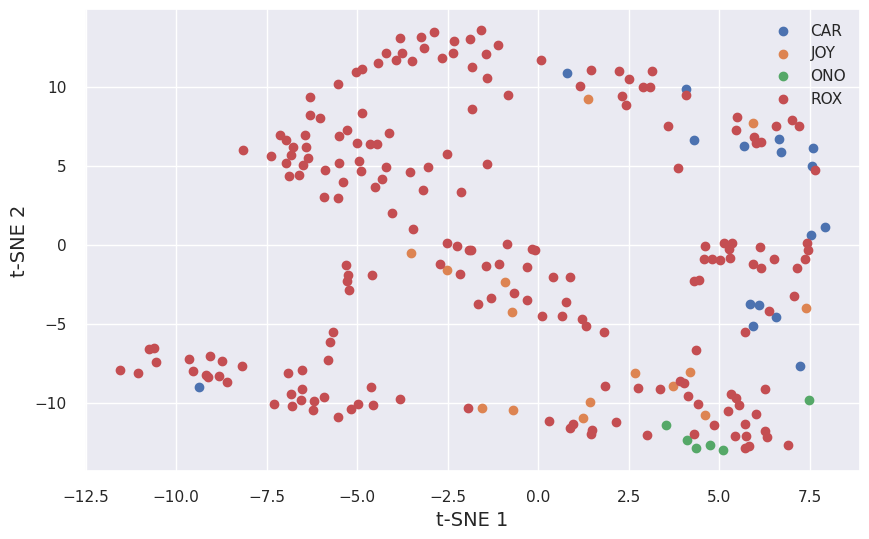

In [62]:
# use t-SNE to reduce the dimensionality of the embeddings

tsne = TSNE(n_components=2, random_state=0)
features_embedded = tsne.fit_transform(features)

plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.xlabel('t-SNE 1', fontsize=FONTSIZE)
plt.ylabel('t-SNE 2', fontsize=FONTSIZE)
# plt.title(f't-SNE of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.legend()
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_tsne_females.png', dpi=300, bbox_inches='tight')
plt.show()

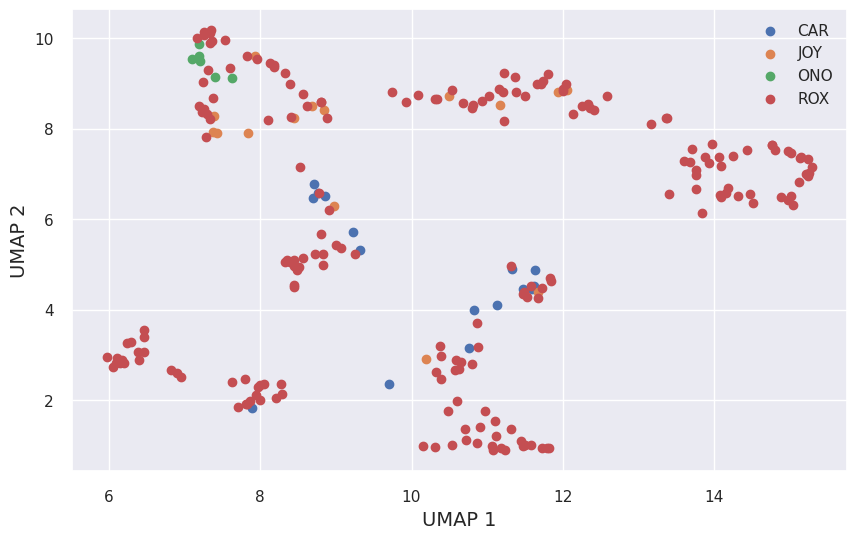

In [302]:
# use UMAP to reduce the dimensionality of the embeddings
reducer = umap.UMAP()
features_embedded = reducer.fit_transform(features)

# plot the embeddings
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.legend()
plt.xlabel('UMAP 1', fontsize=FONTSIZE)
plt.ylabel('UMAP 2', fontsize=FONTSIZE)
# plt.title(f'UMAP of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_umap_females.png', dpi=300, bbox_inches='tight')
plt.show()

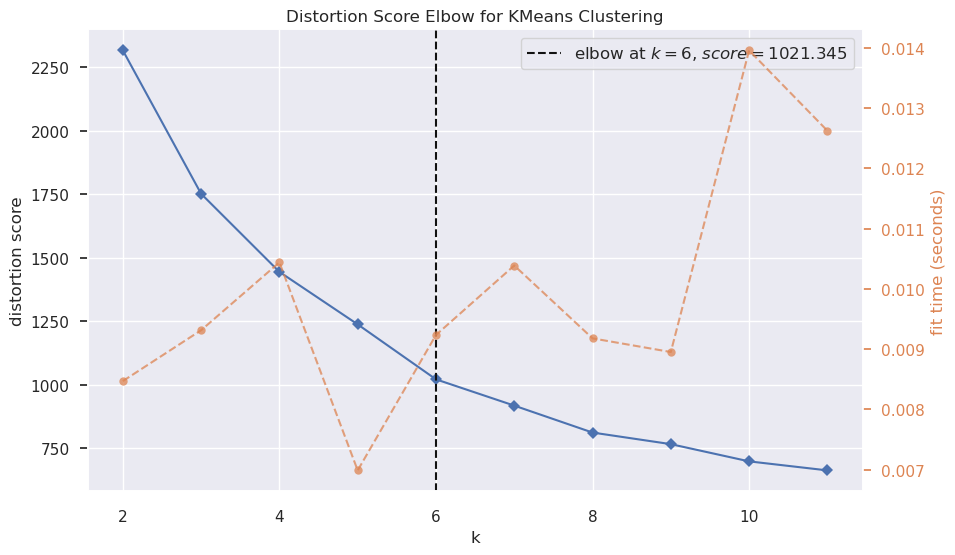

In [63]:
# use the elbow method to find the optimal number of clusters
fig, ax = plt.subplots(figsize=(10, 6))
kelbow_visualizer(KMeans(max_iter=1200, algorithm='elkan'), features, k=(2,12))
fig.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_elbow_females.png', dpi=300, bbox_inches='tight')
plt.show()

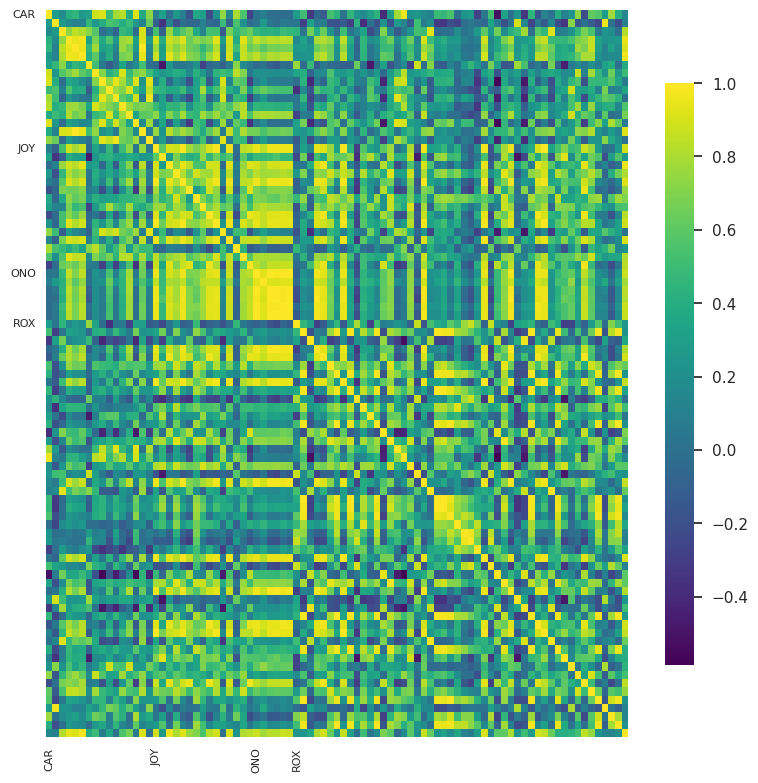

In [64]:
class_labels =  [ dataset.classes[label] for label in labels]

selected_representations, selected_labels  = sample_balanced_representations(features, class_labels, dataset.classes, samples_per_class=50)

# calculate the cosine similarity of the embeddings
cosine_sim = cosine_similarity(selected_representations)

# plot the similarity heatmap
plot_similarity_heatmap(cosine_sim, selected_labels, f'{FIG_PATH}/cosine_similarity_{model_type}_{modelstr}_{method}_heatmap_females.png')


In [65]:
dense121_idx

45

### Classifier Representation Analysis for out-of-distribution samples

In [69]:
# model_type = 'classifier'
# experiment = dense121_idx
# modelstr = MODELSTRS[-1]
# data = np.load(f'{EXPORT_DATA_PATH}/features_{model_type}_{modelstr}__experiment_{experiment}_females.npz', allow_pickle=True)

# features = data['features']
# labels = data['labels']
# label_names = data['label_classes']

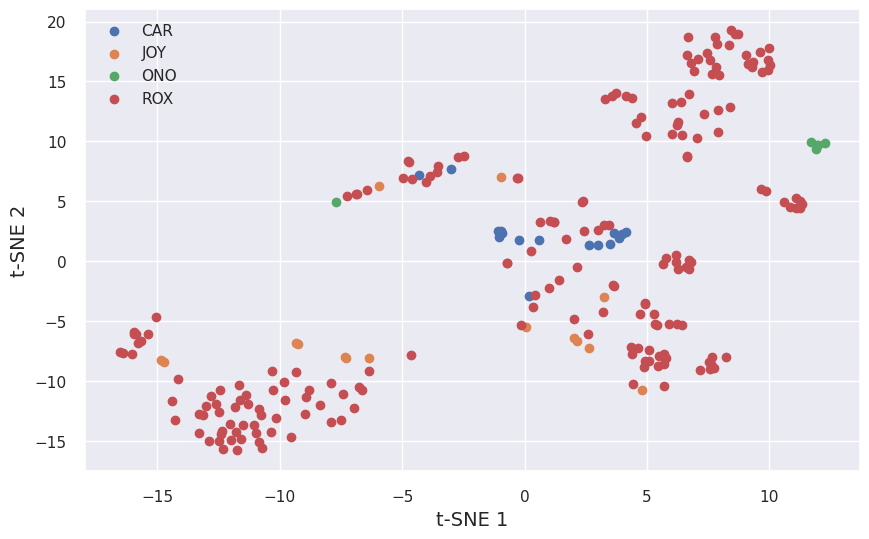

In [313]:
# use t-SNE to reduce the dimensionality of the embeddings

tsne = TSNE(n_components=2, random_state=0)
features_embedded = tsne.fit_transform(features)

plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.xlabel('t-SNE 1', fontsize=FONTSIZE)
plt.ylabel('t-SNE 2', fontsize=FONTSIZE)
# plt.title(f't-SNE of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.legend()
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_experiment_{experiment}_tsne_females.png', dpi=300, bbox_inches='tight')
plt.show()

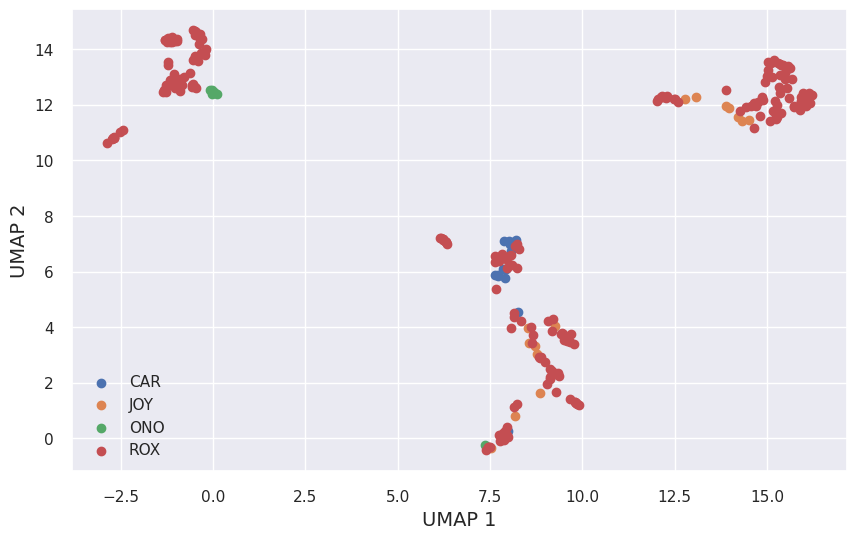

In [314]:
# use UMAP to reduce the dimensionality of the embeddings
reducer = umap.UMAP()
features_embedded = reducer.fit_transform(features)

# plot the embeddings
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.legend()
plt.xlabel('UMAP 1', fontsize=FONTSIZE)
plt.ylabel('UMAP 2', fontsize=FONTSIZE)
# plt.title(f'UMAP of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_experiment_{experiment}_umap_females.png', dpi=300, bbox_inches='tight')
plt.show()

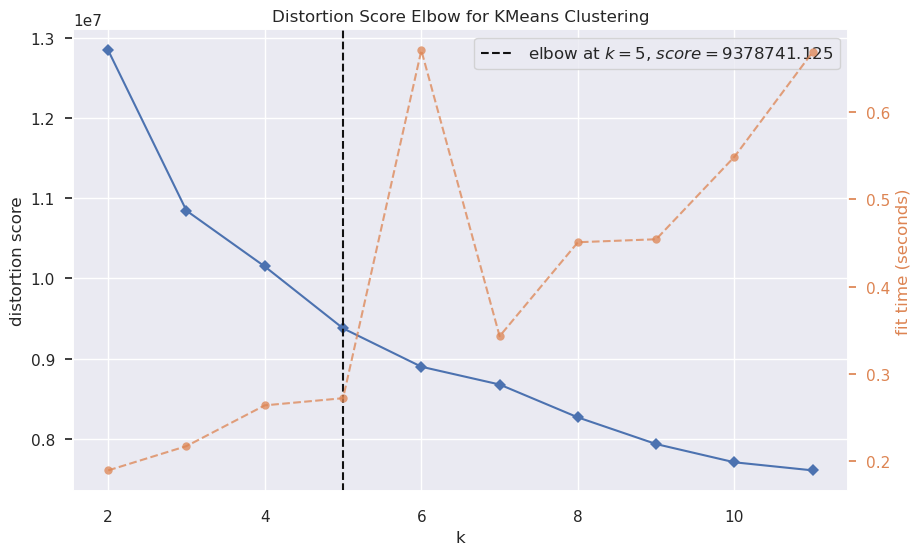

In [316]:
# use the elbow method to find the optimal number of clusters
fig, ax = plt.subplots(figsize=(10, 6))
kelbow_visualizer(KMeans(max_iter=1200, algorithm='elkan'), features, k=(2,12))
fig.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_experiment_{experiment}_elbow_females.png', dpi=300, bbox_inches='tight')
plt.show()

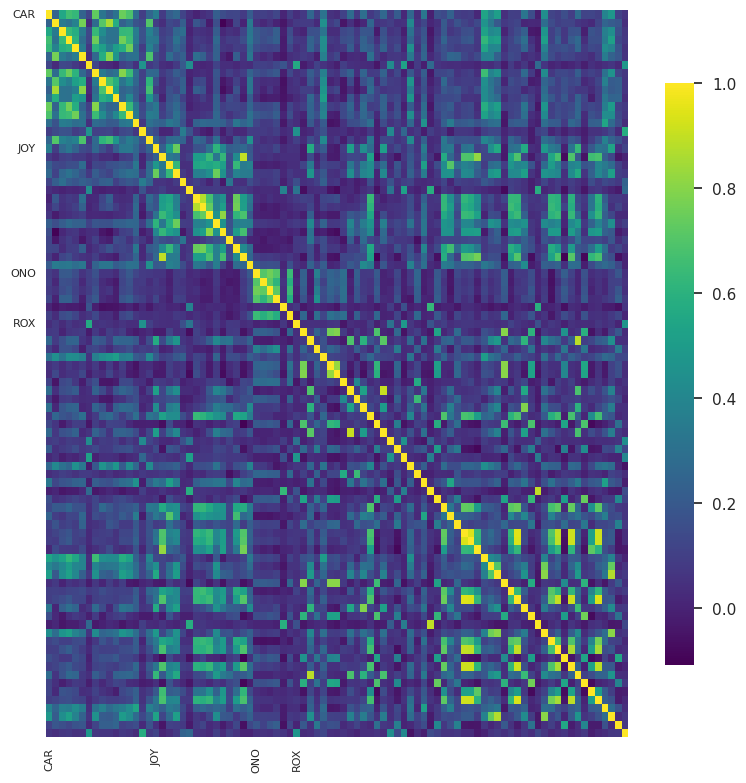

In [317]:
class_labels =  [ dataset.classes[label] for label in labels]

selected_representations, selected_labels  = sample_balanced_representations(features, class_labels, dataset.classes, samples_per_class=50)

# calculate the cosine similarity of the embeddings
cosine_sim = cosine_similarity(selected_representations)

# plot the similarity heatmap
plot_similarity_heatmap(cosine_sim, selected_labels, f'{FIG_PATH}/cosine_similarity_{modelstr}_{model_type}_heatmap_females.png')


In [71]:
# pre-train and ft results
filelist = [f'results/dense121_test_results_chimpanzee_ir_experiment_{dense121_idx}.csv', 'results/dense121_ft_full_test_results_chimpanzee_ir_supcon_experiment_1.csv','results/dense121_ft_full_test_results_chimpanzee_ir_triplet_experiment_1.csv',
            f'results/resnet18_test_results_chimpanzee_ir_experiment_{resnet18_idx}.csv', 'results/resnet18_ft_full_test_results_chimpanzee_ir_supcon_experiment_1.csv', 'results/resnet18_ft_full_test_results_chimpanzee_ir_triplet_experiment_1.csv']


for i in range(6):
    # read the csv files 
    df = pd.read_csv(filelist[i])
    # round to 2 decimal places
    df = df.round(3)
    print(df.head())

   test_loss  test_acc  test_f1
0      1.352     0.573     0.54
   test_loss  test_acc  test_f1
0      1.304     0.617    0.583
   test_loss  test_acc  test_f1
0      1.265     0.626    0.588
   test_loss  test_acc  test_f1
0      1.225     0.673    0.664
   test_loss  test_acc  test_f1
0      1.262     0.647    0.644
   test_loss  test_acc  test_f1
0      1.377     0.589    0.554


### Resnet18 Model

In [72]:
# Load the trained model and make predictions
modelstr =  MODELSTRS[0]
experiment = resnet18_idx
target_class = "chimpanzee_ir"
model_type = "classifier"

In [73]:
dataset = SpectrogramDataset(f"{CHIMPANZEE_DATA_PATH}/val", duration=2, target_sample_rate=SAMPLING_RATE)

dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
sample,label = next(iter(dataloader))

In [75]:

model = CustomCNNModel(num_classes=len(dataset.classes), weights=None, modelstr=MODELSTRS[0])

model.load_state_dict(torch.load(f'{MODELS_PATH}/custom_{modelstr}_chimpanzee_ir_experiment_{experiment}.pth', map_location=torch.device('cpu')))
model.eval();

In [76]:
with torch.inference_mode():
    data = sample['data']
    output = model(data)
    _, predicted = torch.max(output, 1)
    # get the probability of each class
    probabilities = torch.nn.functional.softmax(output, dim=1)
    # get the probability of the predicted class
    predicted_prob = torch.max(probabilities, 1)[0]
    print('Predicted: ', [dataset.classes[p.item()] for p in predicted])

Predicted:  ['CHE', 'ORI', 'PAN', 'PAN', 'CHE', 'CHE', 'ARN', 'ARN', 'CHI', 'LIT', 'PAN', 'CHE', 'THE', 'FRE', 'LOU', 'PAN', 'THE', 'LOU', 'NGO', 'CHI', 'CHE', 'THE', 'CHE', 'PAN', 'LIT', 'ORI', 'FRE', 'LIT', 'CHE', 'LIT', 'NGO', 'LIT', 'ARN', 'ARN', 'ORI', 'LIT', 'NGO', 'THE', 'LIT', 'ARN', 'THE', 'LOU', 'LIT', 'PAN', 'LOU', 'LIT', 'LIT', 'CHI', 'LOU', 'LIT', 'CHI', 'ARN', 'LIT', 'LIT', 'FRE', 'PAN', 'ARN', 'CHI', 'LIT', 'CHE', 'ORI', 'CHI', 'LOU', 'LIT']


In [81]:
# Plot six random samples with their predictions 
idxs = np.random.randint(0, len(sample['data']), 6)

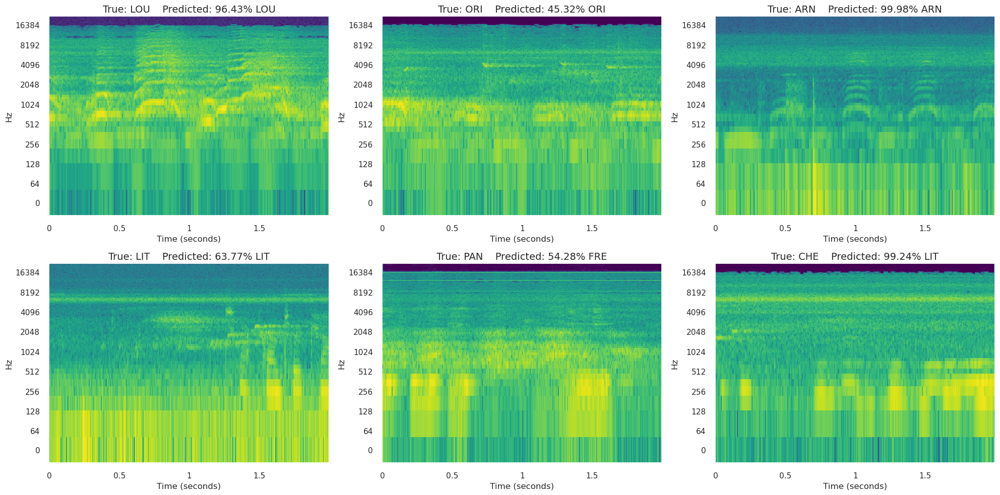

In [82]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
# fig.suptitle('6 Random Samples from ESC-50 dataset')
for i in range(6):
    idx = i % 3
    idy = i // 3
    librosa.display.specshow(sample['data'][idxs[i]].squeeze().numpy(), sr=44100, hop_length=256, ax=ax[idy, idx], x_axis='s', y_axis='log',cmap='viridis')
    ax[idy, idx].set_title(f'True: {dataset.classes[label[idxs[i]]].upper()}    Predicted: {np.round(predicted_prob[idxs[i]].item() *100, 2)}% {dataset.classes[predicted[idxs[i]].item()].upper()}', fontsize=FONTSIZE)
plt.tight_layout()
plt.savefig(FIG_PATH + f'/random_log_spectrogram_{modelstr}_{target_class}_{model_type}_experiment_{experiment}_samples_predictions.png', dpi=300)
plt.show()

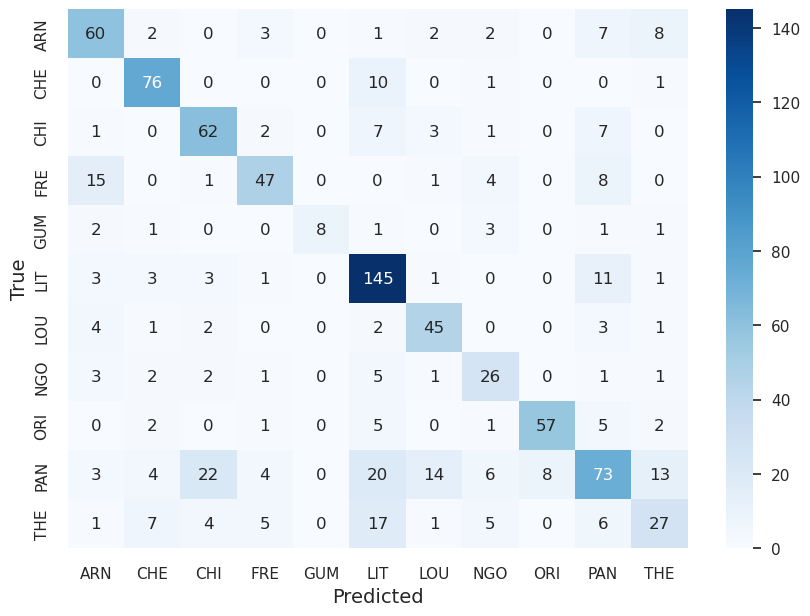

In [83]:
# Plot confusion matrix 
df =  pd.read_csv(f"{RESULTS_PATH}/{modelstr}_test_scores_{target_class}_experiment_{experiment}.csv")

true_labels = df['labels']
pred_labels = df['preds']
class_names = dataset.classes

cm = confusion_matrix(true_labels, pred_labels)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted', fontsize=FONTSIZE)
plt.ylabel('True', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_experiment_{experiment}_confusion_matrix.png', dpi=300)
plt.show()


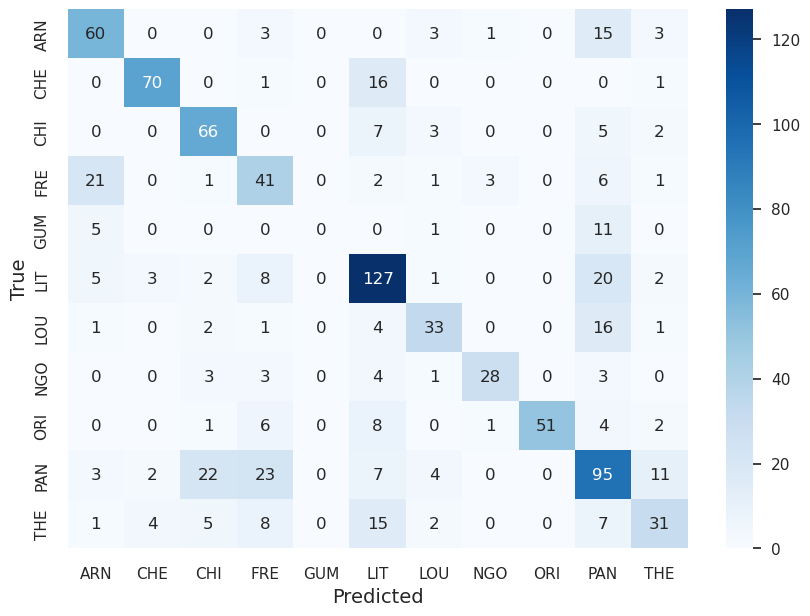

In [85]:
# Plot confusion matrix 
method = 'supcon'
model_type = 'contrastive'
df =  pd.read_csv(f"{RESULTS_PATH}/resnet18_ft_full_test_scores_chimpanzee_ir_{method}_experiment_1.csv")

true_labels = df['labels']
pred_labels = df['preds']
class_names = dataset.classes

cm = confusion_matrix(true_labels, pred_labels)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted', fontsize=FONTSIZE)
plt.ylabel('True', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_{method}_experiment_{experiment}_ft_confusion_matrix.png', dpi=300)
plt.show()


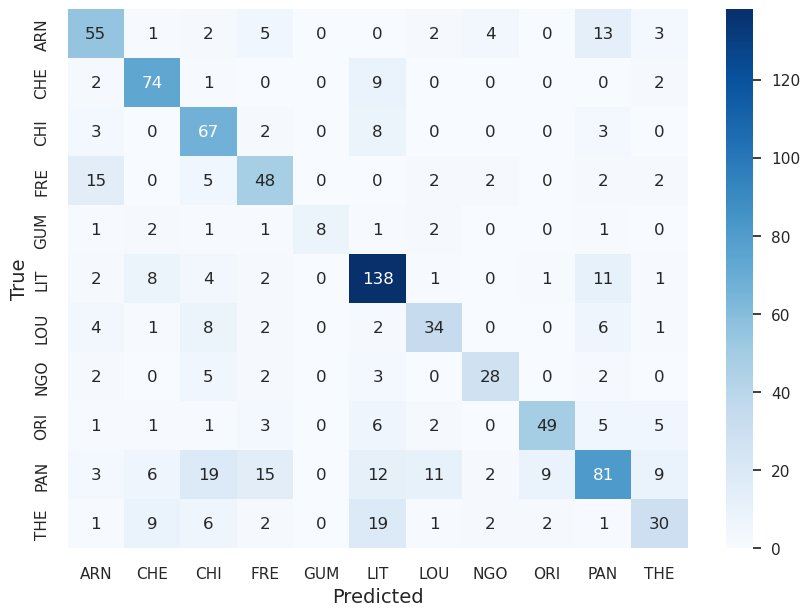

In [327]:
# Plot confusion matrix 
method = 'triplet'
model_type = 'contrastive'
df =  pd.read_csv(f"{RESULTS_PATH}/resnet18_ft_test_scores_chimpanzee_ir_{method}_experiment_1.csv")

true_labels = df['labels']
pred_labels = df['preds']
class_names = dataset.classes

cm = confusion_matrix(true_labels, pred_labels)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted', fontsize=FONTSIZE)
plt.ylabel('True', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_{method}_experiment_{experiment}_ft_confusion_matrix.png', dpi=300)
plt.show()


In [86]:
experiment = resnet18_idx

data = np.load(f'{EXPORT_DATA_PATH}/features_classifier_resnet18_chimpanzee_ir_experiment_{experiment}.npz', allow_pickle=True)

features = data['features']
labels = data['labels']
label_names = data['label_classes']
model_type = 'classifier'

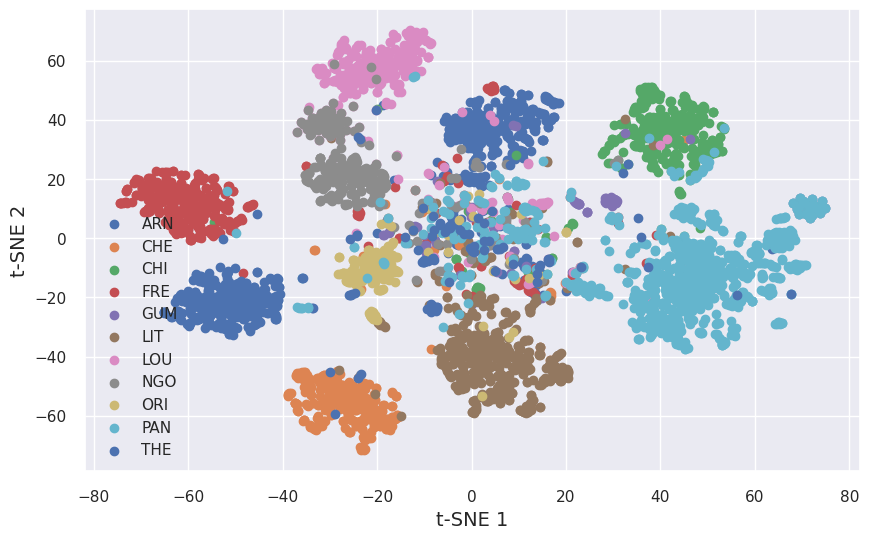

In [87]:
# use t-SNE to reduce the dimensionality of the embeddings

tsne = TSNE(n_components=2, random_state=0)
features_embedded = tsne.fit_transform(features)

plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.xlabel('t-SNE 1', fontsize=FONTSIZE)
plt.ylabel('t-SNE 2', fontsize=FONTSIZE)
# plt.title(f't-SNE of embeddings of learned Panthoot representations', fontsize=FONTSIZE+2)
plt.legend()
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_experiment_{experiment}_tsne.png', dpi=300, bbox_inches='tight')
plt.show()

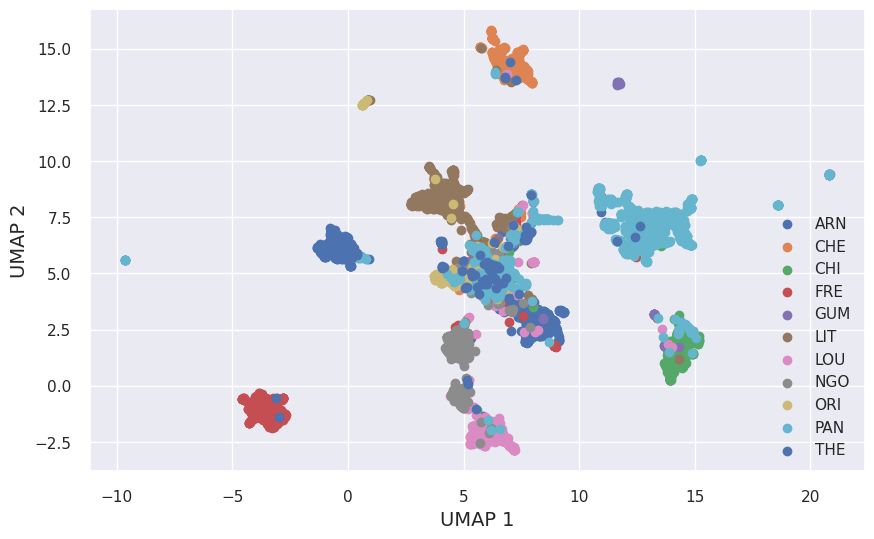

In [88]:
# use UMAP to reduce the dimensionality of the embeddings
reducer = umap.UMAP()
features_embedded = reducer.fit_transform(features)

# plot the embeddings
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.legend()
plt.xlabel('UMAP 1', fontsize=FONTSIZE)
plt.ylabel('UMAP 2', fontsize=FONTSIZE)
# plt.title(f'UMAP of embeddings of learned Panthoot representations', fontsize=FONTSIZE+2)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_experiment_{experiment}_umap.png', dpi=300, bbox_inches='tight')
plt.show()

In [89]:
class_labels =  [ dataset.classes[label] for label in labels]

selected_representations, selected_labels = sample_balanced_representations(features, class_labels, dataset.classes, samples_per_class=50)


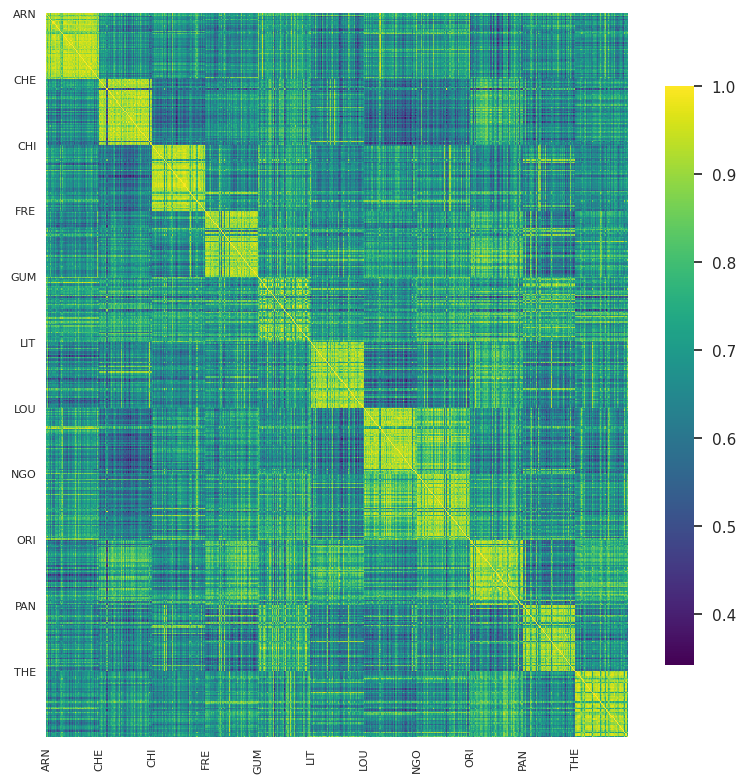

In [90]:
# calculate the cosine similarity of the embeddings
cosine_sim = cosine_similarity(selected_representations)

# plot the similarity heatmap
plot_similarity_heatmap(cosine_sim, selected_labels, f'{FIG_PATH}/cosine_similarity{modelstr}_{target_class}_{model_type}_heatmap.png')

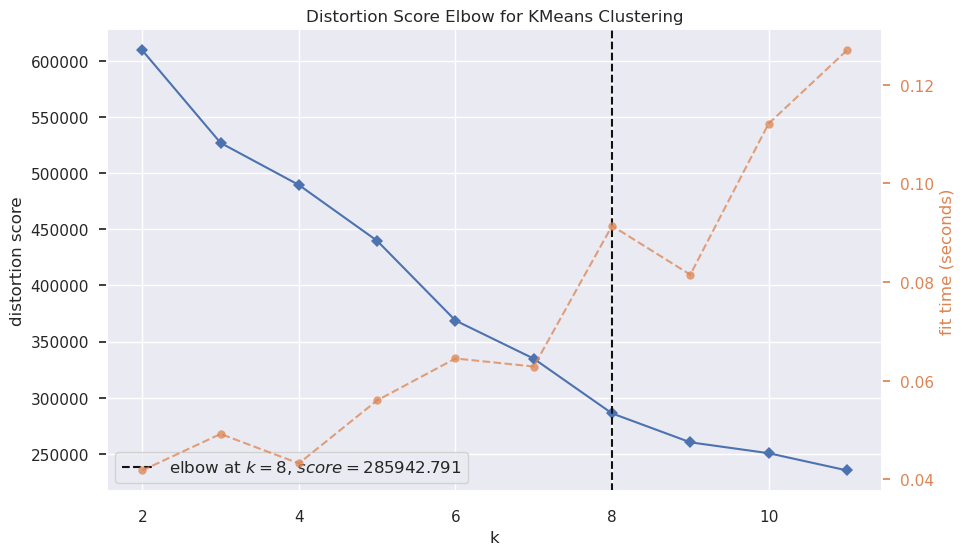

In [91]:
# use the elbow method to find the optimal number of clusters
fig, ax = plt.subplots(figsize=(10, 6))
kelbow_visualizer(KMeans(max_iter=1200, algorithm='elkan'), features, k=(2,12))
fig.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_experiment_{experiment}_elbow.png', dpi=300, bbox_inches='tight')
plt.show()

### Resnet18 Contrastive Model

In [92]:
method = 'supcon'
data = np.load(f'{EXPORT_DATA_PATH}/features_contrastive_resnet18_chimpanzee_ir_{method}_experiment_1.npz', allow_pickle=True)

features = data['features']
labels = data['labels']
label_names = data['label_classes']
model_type = 'contrastive'
modelstr = MODELSTRS[0]

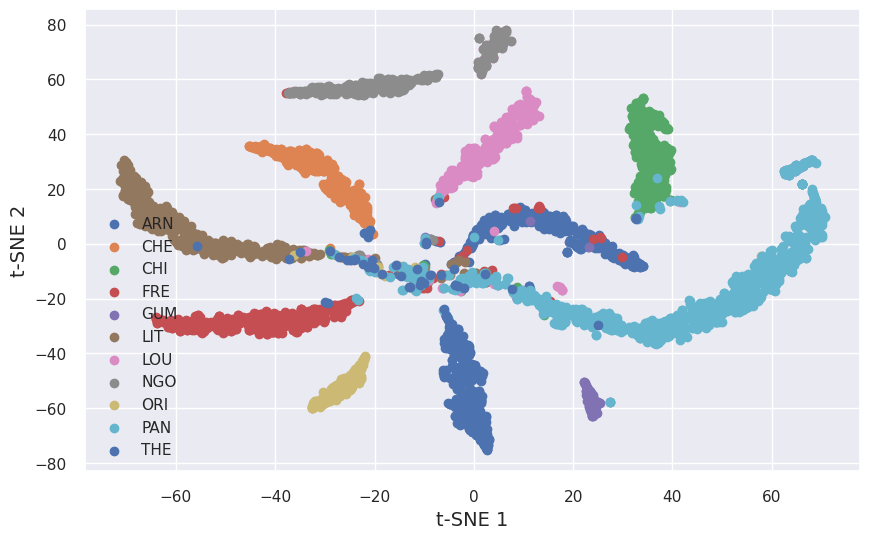

In [93]:
# use t-SNE to reduce the dimensionality of the embeddings

tsne = TSNE(n_components=2, random_state=0)
features_embedded = tsne.fit_transform(features)

plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.xlabel('t-SNE 1', fontsize=FONTSIZE)
plt.ylabel('t-SNE 2', fontsize=FONTSIZE)
# plt.title(f't-SNE of embeddings of learned Panthoot representations', fontsize=FONTSIZE+2)
plt.legend()
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_{method}_experiment_{experiment}_tsne.png', dpi=300, bbox_inches='tight')
plt.show()

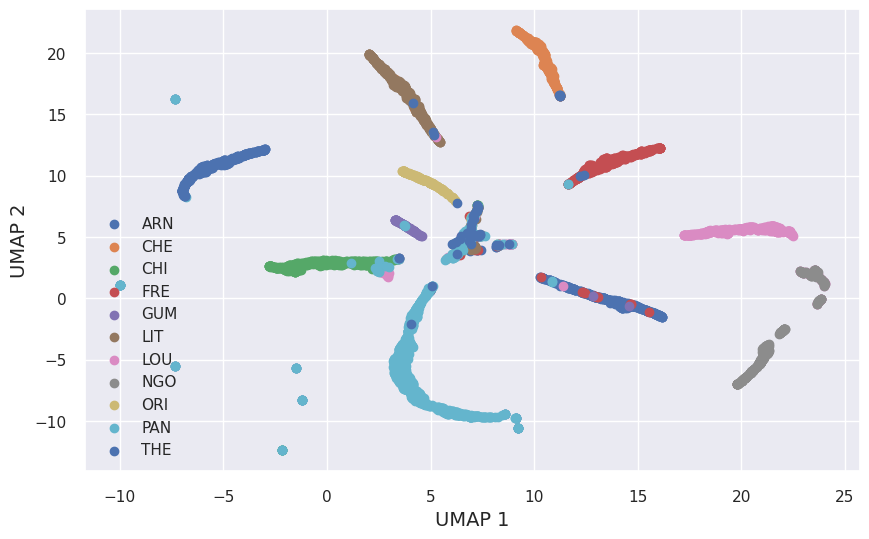

In [94]:
# use UMAP to reduce the dimensionality of the embeddings
reducer = umap.UMAP()
features_embedded = reducer.fit_transform(features)

# plot the embeddings
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.legend()
plt.xlabel('UMAP 1', fontsize=FONTSIZE)
plt.ylabel('UMAP 2', fontsize=FONTSIZE)
# plt.title(f'UMAP of embeddings of learned Panthoot representations', fontsize=FONTSIZE+2)
plt.savefig(f'{FIG_PATH}/{modelstr}_{target_class}_{model_type}_{method}_experiment_{experiment}_umap.png', dpi=300, bbox_inches='tight')
plt.show()

In [95]:
class_labels =  [ dataset.classes[label] for label in labels]

selected_representations, selected_labels = sample_balanced_representations(features, class_labels, dataset.classes, samples_per_class=50)


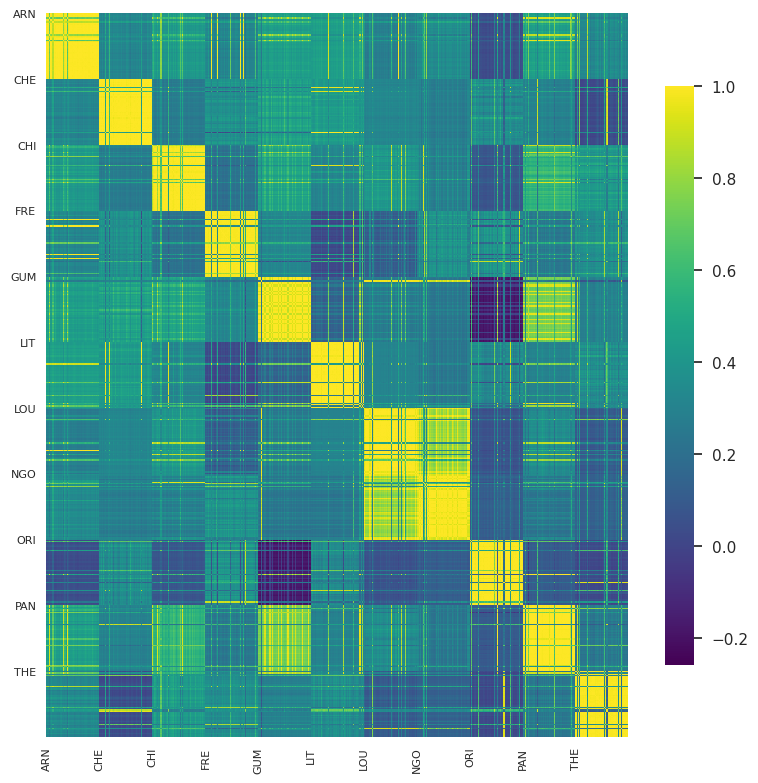

In [96]:
# calculate the cosine similarity of the embeddings
cosine_sim = cosine_similarity(selected_representations)

# plot the similarity heatmap
plot_similarity_heatmap(cosine_sim, selected_labels, f'{FIG_PATH}/cosine_similarity{modelstr}_{target_class}_{model_type}_{method}_heatmap.png')

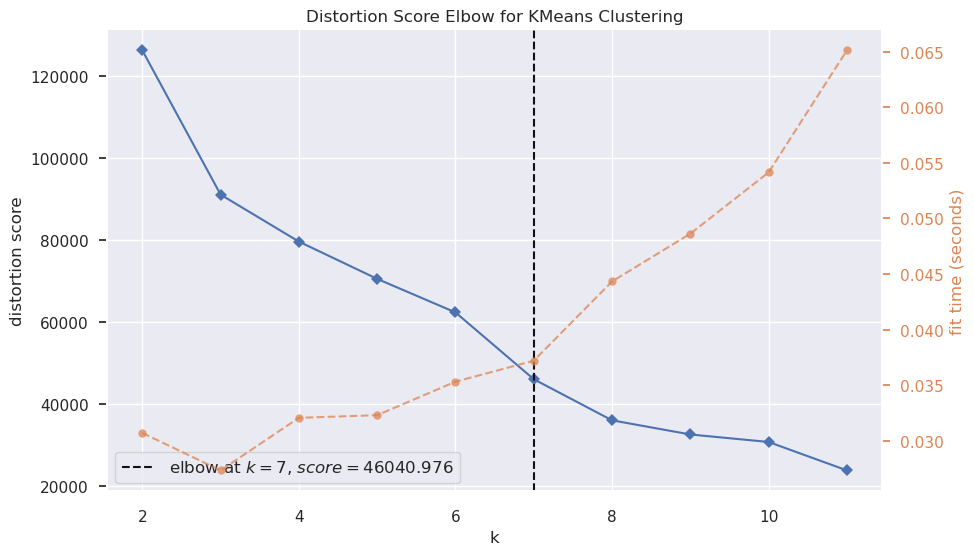

In [97]:
# use the elbow method to find the optimal number of clusters
fig, ax = plt.subplots(figsize=(10, 6))
kelbow_visualizer(KMeans(max_iter=1200, algorithm='elkan'), features, k=(2,12))
fig.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_elbow.png', dpi=300, bbox_inches='tight')
plt.show()

### Out of distribution generalization analysis for Classifier

In [98]:
dataset = SpectrogramDataset(FEMALE_DATA_PATH, duration=2, target_sample_rate=SAMPLING_RATE)

dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

In [100]:
# model_type = 'classifier'
# experiment = resnet18_idx
# modelstr = MODELSTRS[0]

# data = np.load(f'{EXPORT_DATA_PATH}/features_classifier_resnet18__experiment_{experiment}_females.npz', allow_pickle=True)

# features = data['features']
# labels = data['labels']
# label_names = data['label_classes']

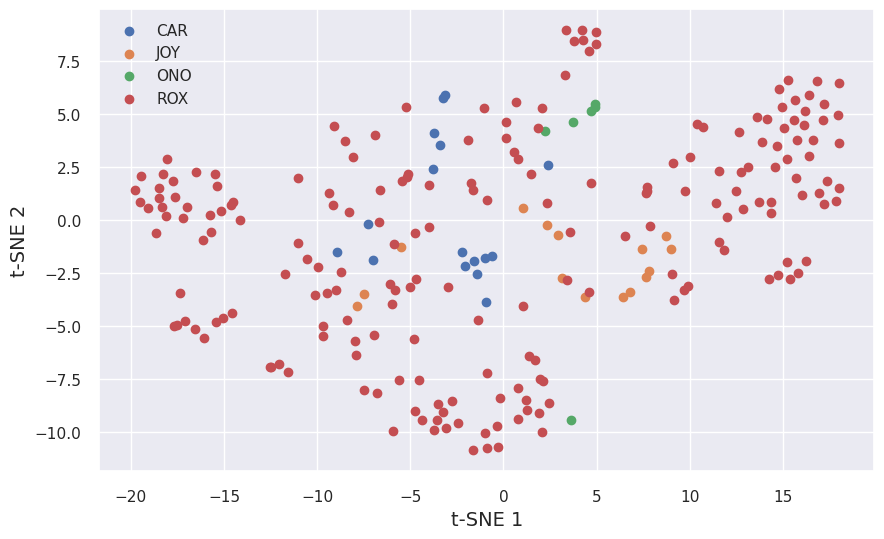

In [374]:
# use t-SNE to reduce the dimensionality of the embeddings

tsne = TSNE(n_components=2, random_state=0)
features_embedded = tsne.fit_transform(features)

plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.xlabel('t-SNE 1', fontsize=FONTSIZE)
plt.ylabel('t-SNE 2', fontsize=FONTSIZE)
# plt.title(f't-SNE of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.legend()
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_experiment_{experiment}_tsne_females.png', dpi=300, bbox_inches='tight')
plt.show()

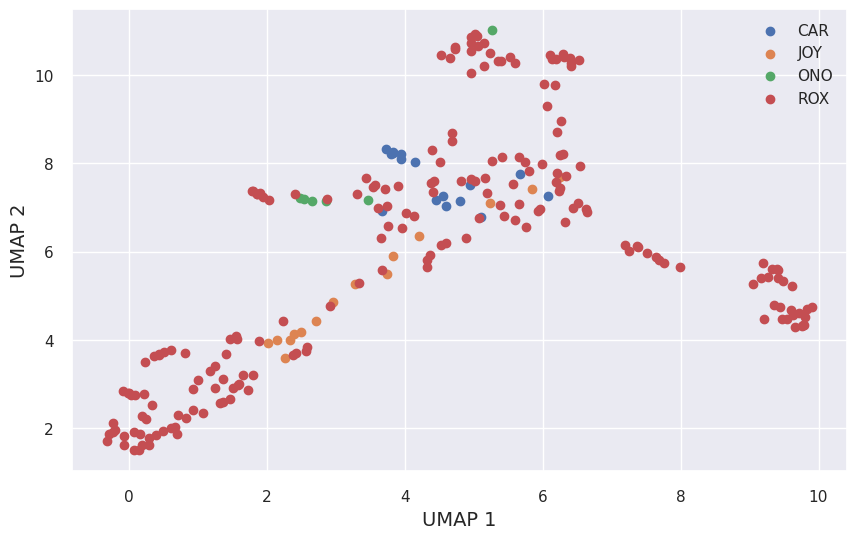

In [375]:
# use UMAP to reduce the dimensionality of the embeddings
reducer = umap.UMAP()
features_embedded = reducer.fit_transform(features)

# plot the embeddings
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.legend()
plt.xlabel('UMAP 1', fontsize=FONTSIZE)
plt.ylabel('UMAP 2', fontsize=FONTSIZE)
# plt.title(f'UMAP of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_experiment_{experiment}_umap_females.png', dpi=300, bbox_inches='tight')
plt.show()

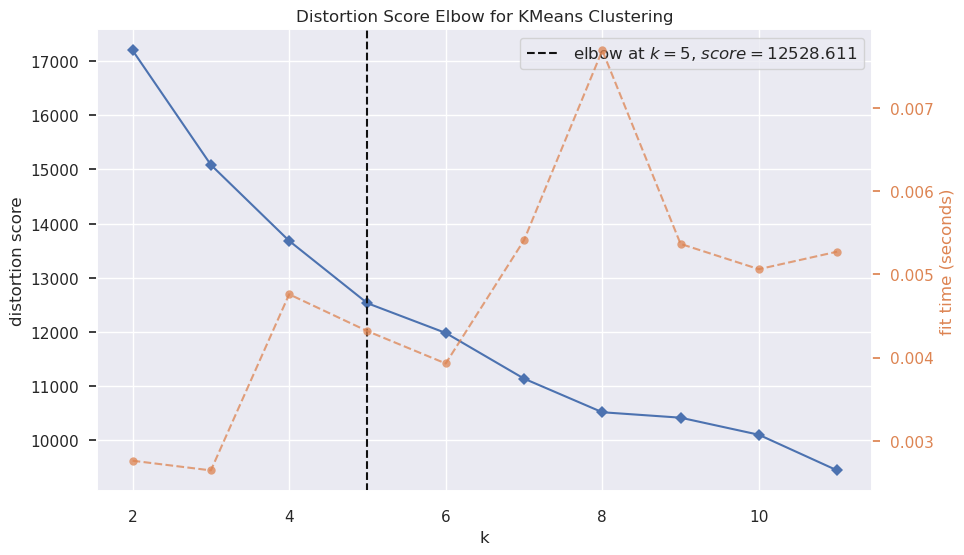

In [379]:
# use the elbow method to find the optimal number of clusters
fig, ax = plt.subplots(figsize=(10, 6))
kelbow_visualizer(KMeans(max_iter=1200, algorithm='elkan'), features, k=(2,12))
fig.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_experiment_{experiment}_elbow_females.png', dpi=300, bbox_inches='tight')
plt.show()

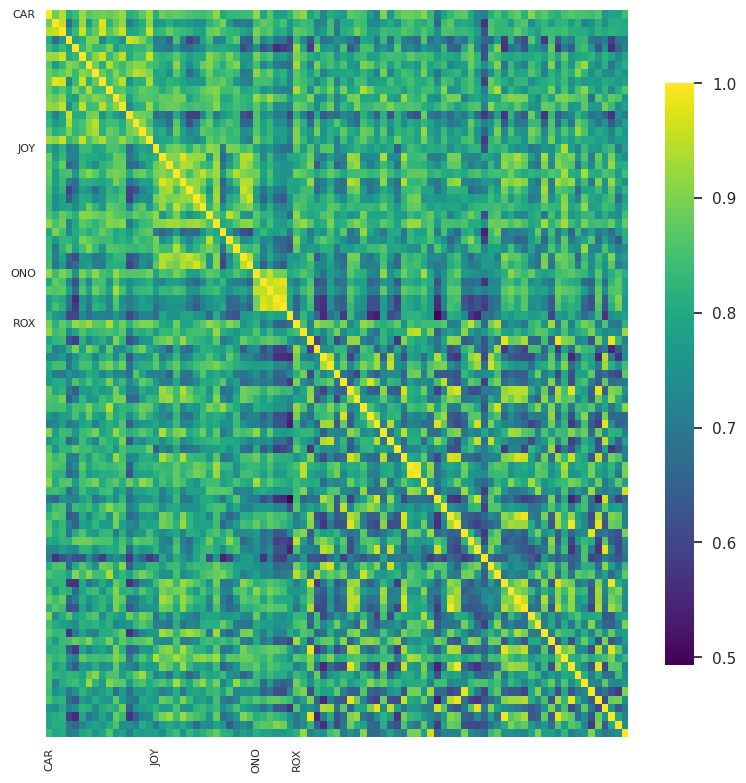

In [380]:
class_labels =  [ dataset.classes[label] for label in labels]

selected_representations, selected_labels  = sample_balanced_representations(features, class_labels, dataset.classes, samples_per_class=50)

# calculate the cosine similarity of the embeddings
cosine_sim = cosine_similarity(selected_representations)

# plot the similarity heatmap
plot_similarity_heatmap(cosine_sim, selected_labels, f'{FIG_PATH}/cosine_similarity_{model_type}_{modelstr}__heatmap_females.png')


### Out of distribution generalization analysis for Contrastive Model

In [389]:
model_type = 'contrastive'
experiment = 1
modelstr = MODELSTRS[0]
method = 'supcon'

data = np.load(f'{EXPORT_DATA_PATH}/features_contrastive_resnet18__{method}_experiment_1_females.npz', allow_pickle=True)

features = data['features']
labels = data['labels']
label_names = data['label_classes']

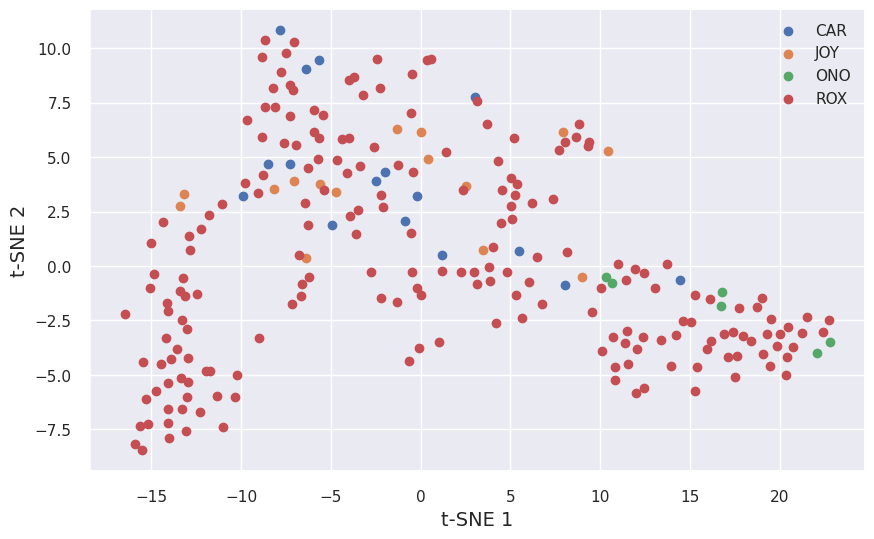

In [390]:
# use t-SNE to reduce the dimensionality of the embeddings

tsne = TSNE(n_components=2, random_state=0)
features_embedded = tsne.fit_transform(features)

plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.xlabel('t-SNE 1', fontsize=FONTSIZE)
plt.ylabel('t-SNE 2', fontsize=FONTSIZE)
# plt.title(f't-SNE of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.legend()
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_tsne_females.png', dpi=300, bbox_inches='tight')
plt.show()

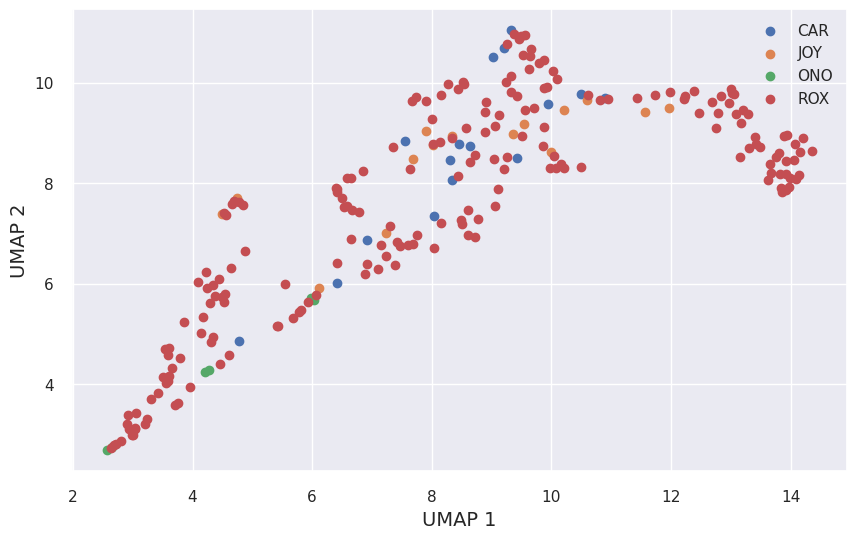

In [391]:
# use UMAP to reduce the dimensionality of the embeddings
reducer = umap.UMAP()
features_embedded = reducer.fit_transform(features)

# plot the embeddings
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(dataset.classes):
    plt.scatter(features_embedded[labels == i, 0], features_embedded[labels == i, 1], label=class_name)
plt.legend()
plt.xlabel('UMAP 1', fontsize=FONTSIZE)
plt.ylabel('UMAP 2', fontsize=FONTSIZE)
# plt.title(f'UMAP of embeddings of learned Panthoot representations', fontsize=FONTSIZE)
plt.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_umap_females.png', dpi=300, bbox_inches='tight')
plt.show()

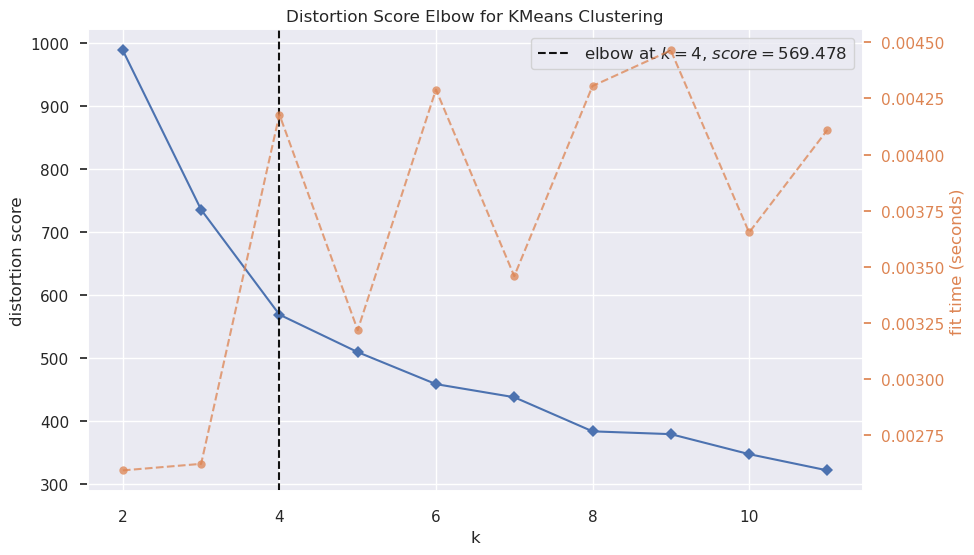

In [394]:
# use the elbow method to find the optimal number of clusters
fig, ax = plt.subplots(figsize=(10, 6))
kelbow_visualizer(KMeans(max_iter=1200, algorithm='elkan'), features, k=(2,12))
fig.savefig(f'{FIG_PATH}/{modelstr}_{model_type}_{target_class}_{method}_experiment_{experiment}_elbow_females.png', dpi=300, bbox_inches='tight')
plt.show()

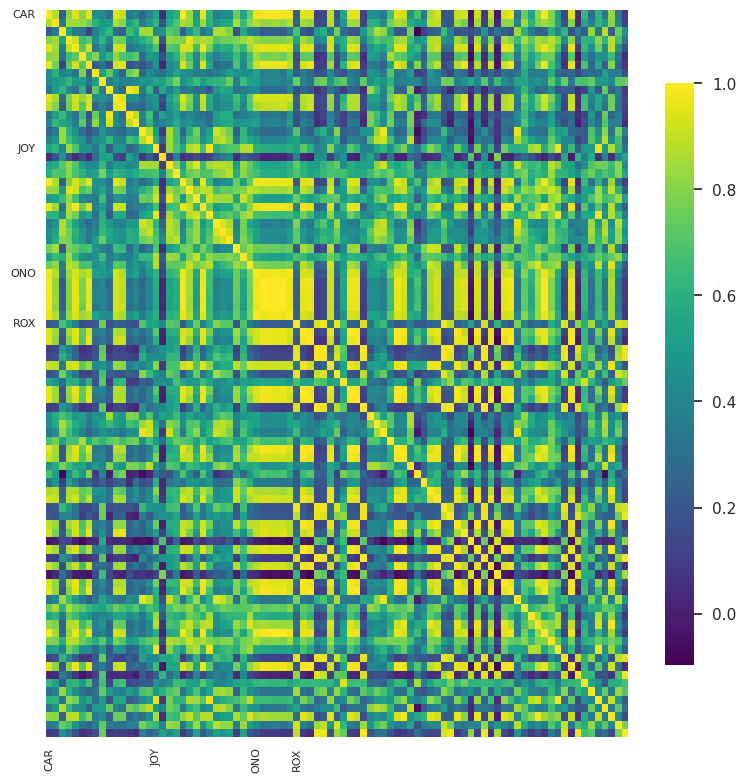

In [396]:
class_labels =  [ dataset.classes[label] for label in labels]

selected_representations, selected_labels  = sample_balanced_representations(features, class_labels, dataset.classes, samples_per_class=50)

# calculate the cosine similarity of the embeddings
cosine_sim = cosine_similarity(selected_representations)

# plot the similarity heatmap
plot_similarity_heatmap(cosine_sim, selected_labels, f'{FIG_PATH}/cosine_similarity_{model_type}_{modelstr}_{method}__heatmap_females.png')


In [398]:
dense121_idx, resnet18_idx

(34, 12)